# Fib

Notebook to make the Fibroblast Supg fig1 heatmap.
Idea is to test R JupyterNotebooks tech and feasibility as FAIR sharing 
backbone in github and the cloud.

# Packages

In [1]:
library(tidyverse)
library(Seurat)
library(ComplexHeatmap)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching SeuratObject

Attaching sp

Loading required package: grid

ComplexHeatmap version 2.12.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This mess

# Data prep

Load in datasets

In [2]:
crctmeWT <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeWT.rds")
crctmeA <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeA.rds")
crctmeAK <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeAK.rds")
crctmeAKP <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/crctmeAKP.rds")
tmecontrols <- readRDS("../../../Analysis/Final_Analysis/Output_Datasets/tmecontrols.rds")
for (i in 1:length(crctmeWT)) {
  print(crctmeWT[[i]]@project.name)
  print(unique(crctmeWT[[i]]@active.ident))
}
for (i in 1:length(crctmeA)) {
  print(crctmeA[[i]]@project.name)
  print(unique(crctmeA[[i]]@active.ident))
}
for (i in 1:length(crctmeAK)) {
  print(crctmeAK[[i]]@project.name)
  print(unique(crctmeAK[[i]]@active.ident))
}
for (i in 1:length(crctmeAKP)) {
  print(crctmeAKP[[i]]@project.name)
  print(unique(crctmeAKP[[i]]@active.ident))
}
for (i in 1:length(tmecontrols)) {
  print(tmecontrols[[i]]@project.name)
  print(unique(tmecontrols[[i]]@active.ident))
}

[1] "cocultWTFib"
 [1] fCd34      fCd34frz   eAbs       eStemE     fCd34cyc   fThy1     
 [7] fCd34myo   eStem/AbsP eBasal     eSec       fLowQ     
11 Levels: fThy1 fCd34frz fCd34myo fCd34 eStemE eStem/AbsP fCd34cyc ... fLowQ
[1] "cocultWTMac"
[1] mC1    eStem2 mHmox  eAbs   eSec   eAbsP  eStem1
Levels: mHmox eAbs mC1 eStem2 eAbsP eStem1 eSec
[1] "cocultWTMacFib"
 [1] eStem    mC1      eAbs/Sec mHmox    fCd34-3  fCd34cyc eBasal   fCd34-2 
 [9] fCd34-1  fCd34-4  fThy1    mMid     mS100   
13 Levels: mC1 eStem eAbs/Sec fCd34-1 mMid mHmox fCd34-2 fCd34cyc ... fCd34-4
[1] "cocultAFib"
[1] fCd34-1  fCd34myo eStem    eStemOE  eBasal   fThy1    fCd34-2  eAbsP   
[9] eSec    
Levels: fCd34-1 eStem fThy1 fCd34myo eStemOE fCd34-2 eBasal eAbsP eSec
[1] "cocultAMac"
[1] eAbs/Sec  mMid1     mMid2     eStem     mC1       eStemOE   eStemArtf
[8] mHmox     mMid3    
Levels: mC1 eStem eAbs/Sec mHmox mMid1 mMid2 eStemOE eStemArtf mMid3
[1] "cocultAMacFib"
[1] fCd34-2       eStemOE       mHmox         e

Still need to add fibros from 2cnd exp

wE USED mito_content <3 $nCount_RNA<86000 & nCount_RNA>1800 & nFeature_RNA>1200

Fib

In [44]:
INTfibF1_list <- c()
for (i in c(1,3)) { #Obejcts with macs are first and third entries
  INTfibF1_list <- append(INTfibF1_list, 
                        c(
                        subset(crctmeWT[[i]], idents = levels(
                          crctmeWT[[i]]@active.ident)[startsWith(
                                levels(crctmeWT[[i]]@active.ident), "f")]),
                        subset(crctmeA[[i]], idents = levels(
                          crctmeA[[i]]@active.ident)[startsWith(
                                levels(crctmeA[[i]]@active.ident), "f")]),
                        subset(crctmeAK[[i]], idents = levels(
                          crctmeAK[[i]]@active.ident)[startsWith(
                                levels(crctmeAK[[i]]@active.ident), "f")]),
                        subset(crctmeAKP[[i]], idents = levels(
                          crctmeAKP[[i]]@active.ident)[startsWith(
                                levels(crctmeAKP[[i]]@active.ident), "f")]),
                        subset(tmecontrols[[i]], idents = levels(
                          tmecontrols[[i]]@active.ident)[startsWith(
                                levels(tmecontrols[[i]]@active.ident), "f")])
                        )
                        )
}
length(INTfibF1_list)

[1] 10

Add fibro datasets from the second experiment

In [ ]:
aug21_WTorg <- readRDS("../RData/aug21_WTorg.rds")

In [14]:
epi_markers <- c("Epcam", "Krt8", "Krt19", "Krt18", "Cldn7", "Cystm1")
fib_markers <- c("Pdgfra", "Dcn","Ptn","C3")

[1] "WTorg_CD34hi"
An object of class Seurat 
45557 features across 6746 samples within 2 assays 
Active assay: SCT (22288 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate


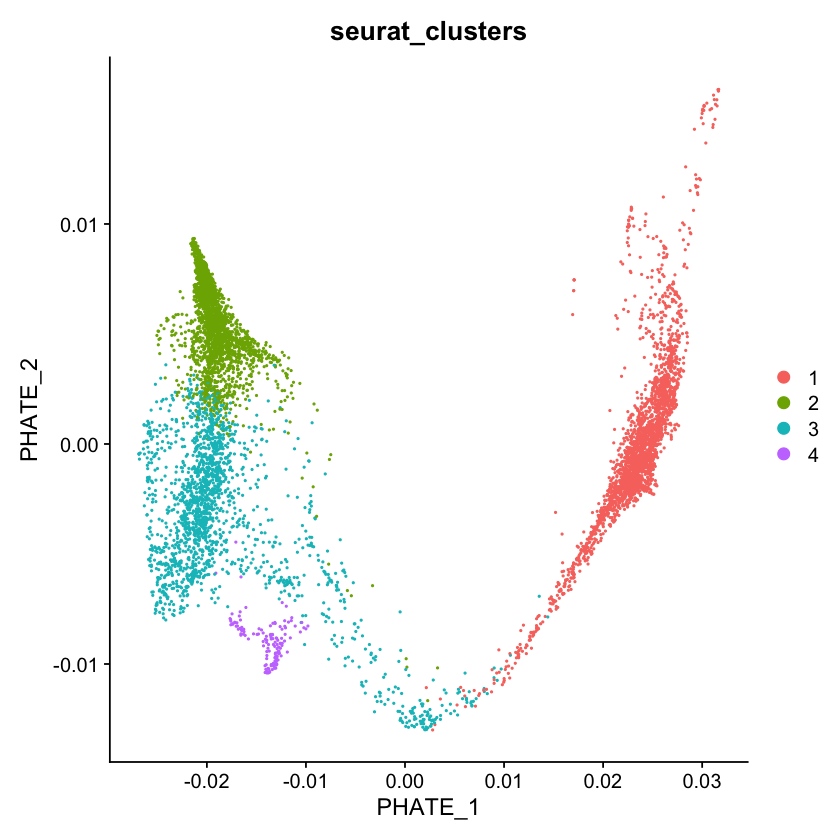

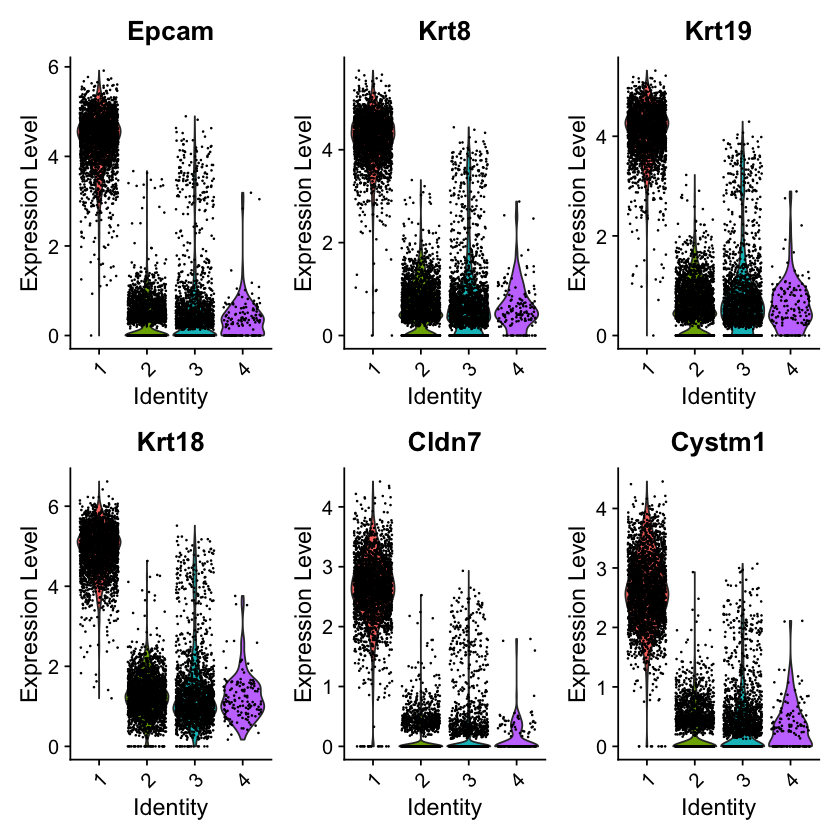

[1] "WTorg_CD34hilo"
An object of class Seurat 
45418 features across 4387 samples within 2 assays 
Active assay: SCT (22127 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate


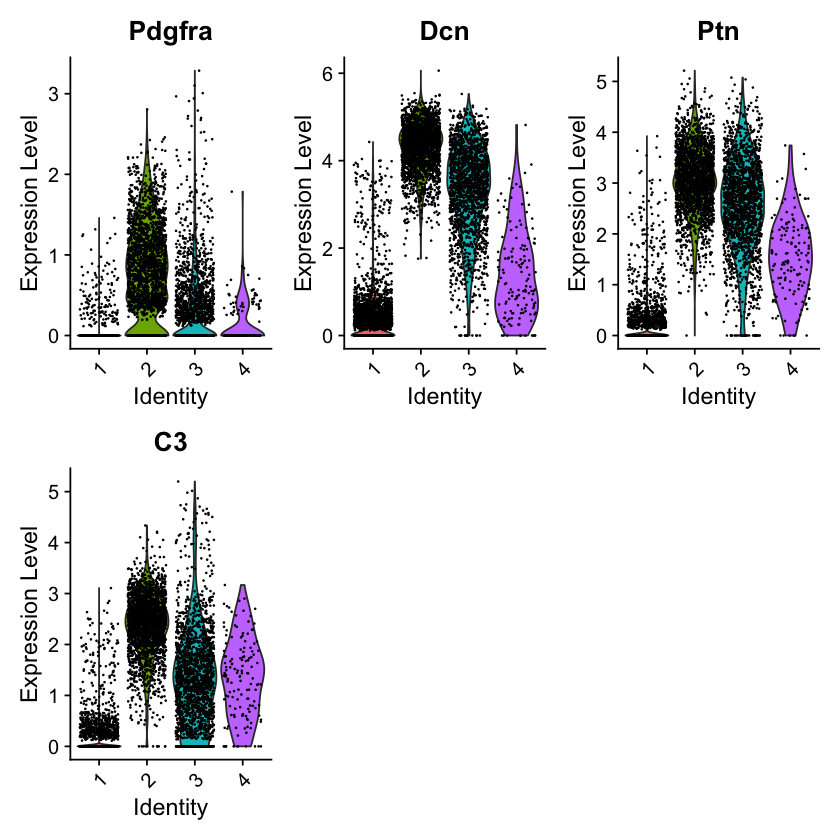

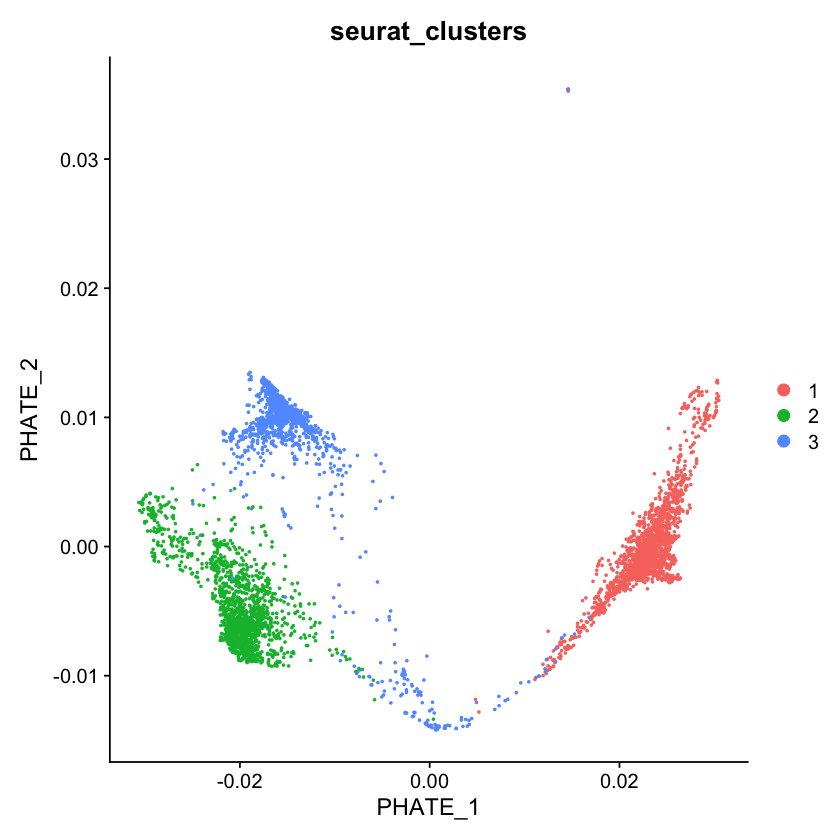

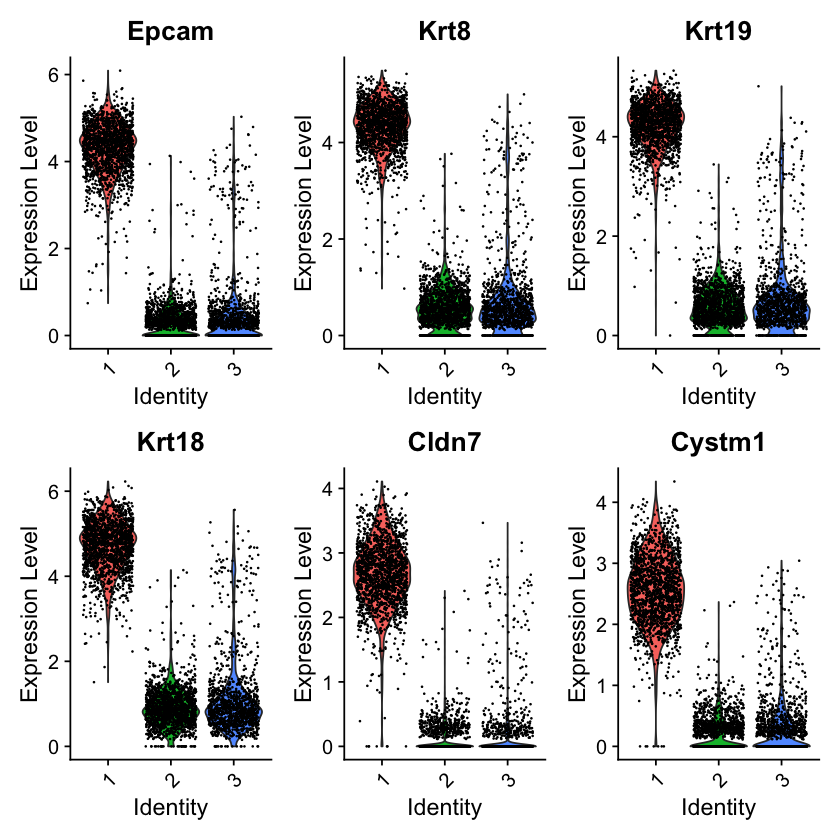

[1] "WTorg_CD34lo"
An object of class Seurat 
44014 features across 3643 samples within 2 assays 
Active assay: SCT (21457 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate


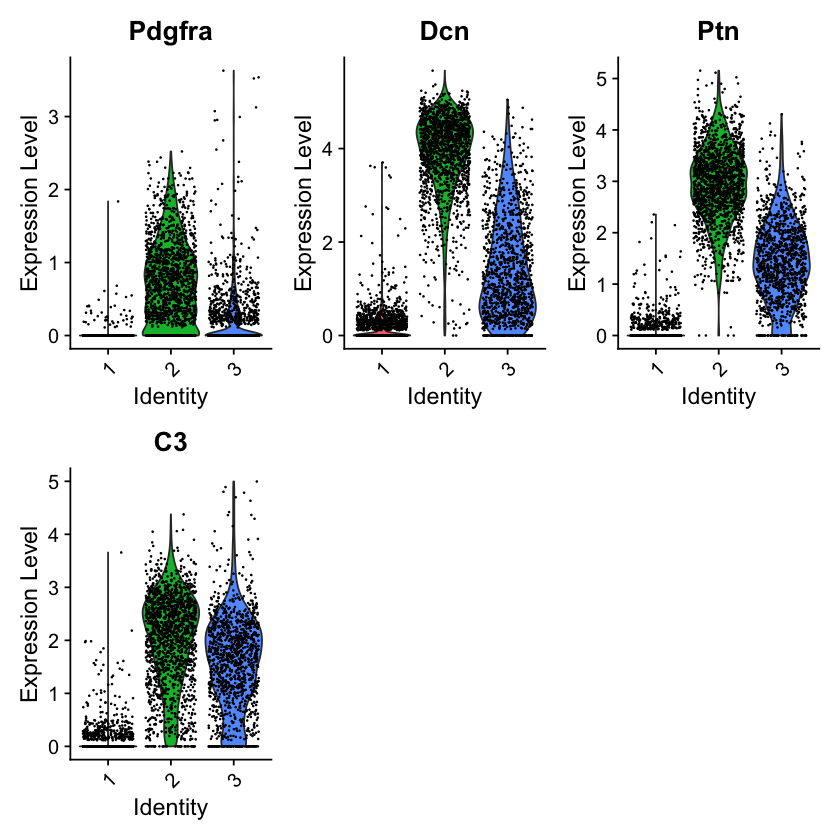

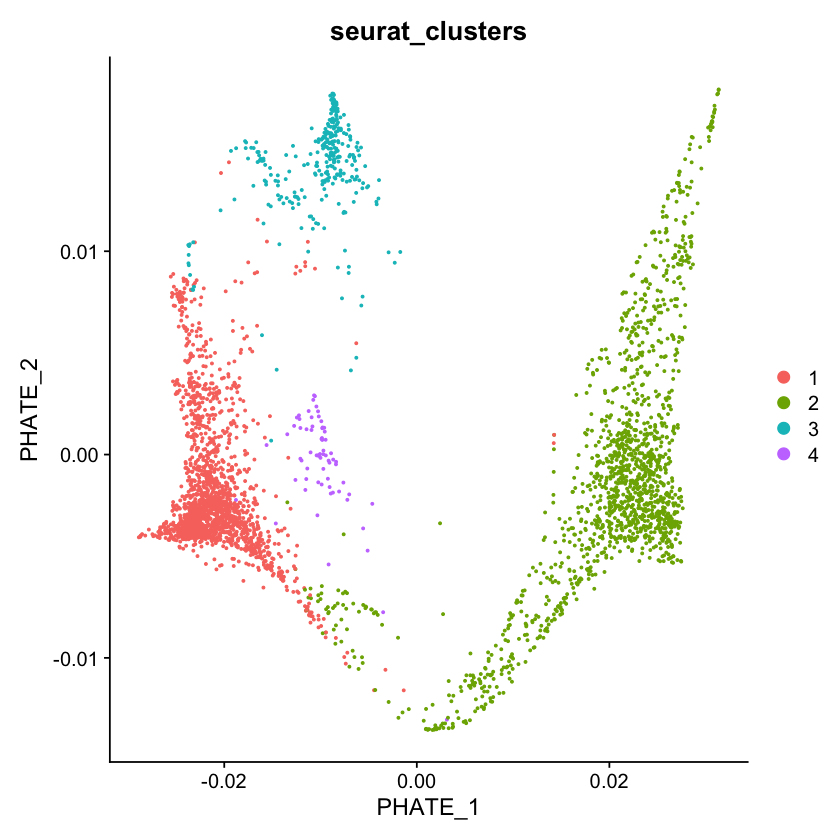

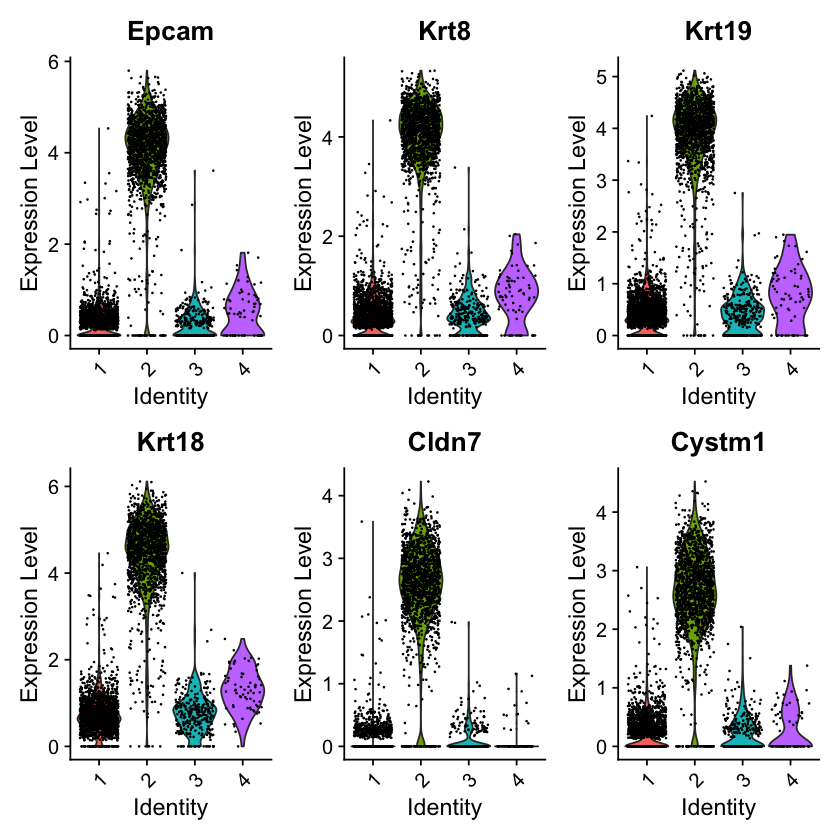

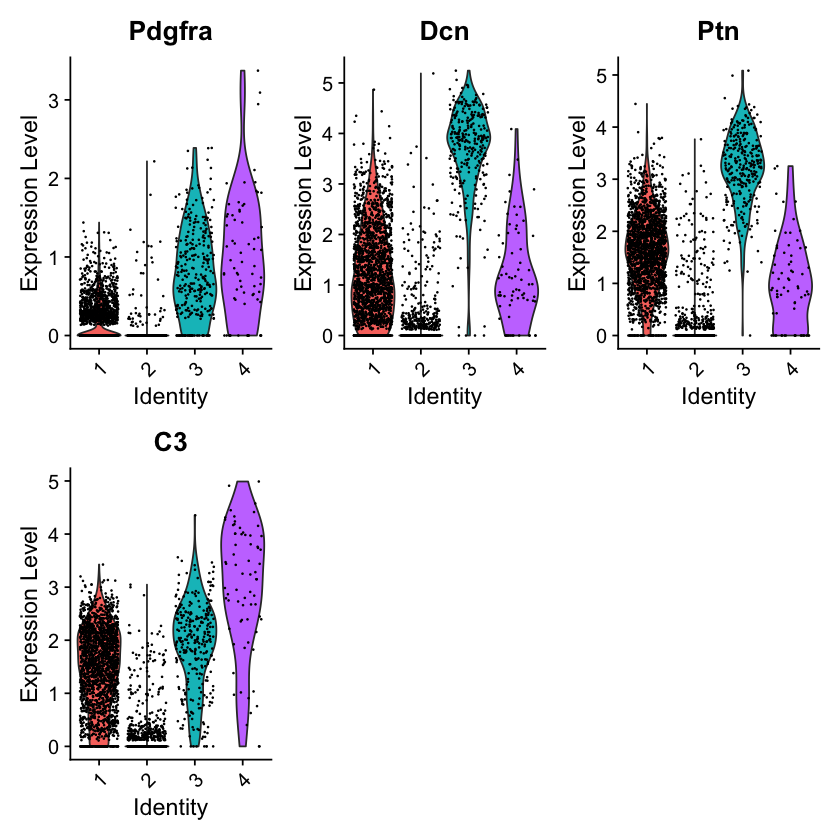

In [20]:
# for (i in 1:length(aug21_WTorg)) { ONLY USING THE COCULTURES (FIRST 3 DATASETS)
for (i in 1:3) {
    print(aug21_WTorg[[i]]@project.name)
    print(aug21_WTorg[[i]])
    print(DimPlot(aug21_WTorg[[i]], reduction="phate", group.by="seurat_clusters"))
    print(VlnPlot(aug21_WTorg[[i]], features = epi_markers, group.by = "seurat_clusters", assay = "RNA"))
    print(VlnPlot(aug21_WTorg[[i]], features = fib_markers, group.by = "seurat_clusters", assay = "RNA"))
}

In [46]:
INTfibF1_list <- append(INTfibF1_list, 
                        c(
                        subset(aug21_WTorg[[1]], subset = seurat_clusters %in% c(2,3,4)),
                        subset(aug21_WTorg[[2]], subset = seurat_clusters %in% c(2,3)),
                        subset(aug21_WTorg[[3]], subset = seurat_clusters %in% c(1,3,4))
                        )
                        )

In [47]:
for (i in 1:length(INTfibF1_list)) {
    print(unique(INTfibF1_list[[i]]@active.ident))
    names(INTfibF1_list)[i] <- INTfibF1_list[[i]]@project.name
}
INTfibF1_list

[1] fCd34    fCd34frz fCd34cyc fThy1    fCd34myo fLowQ   
Levels: fThy1 fCd34frz fCd34myo fCd34 fCd34cyc fLowQ
[1] fCd34-1  fCd34myo fThy1    fCd34-2 
Levels: fCd34-1 fThy1 fCd34myo fCd34-2
[1] fCd34-1  fCd34frz fThy1    fCd34-2  fCd34cyc
Levels: fThy1 fCd34frz fCd34-1 fCd34-2 fCd34cyc
[1] fThy1    fCd34    fCd34cyc fCd34frz
Levels: fCd34frz fThy1 fCd34 fCd34cyc
[1] fThy1ccl-1 fThy1ccl-2 fThy1      fCd34frz   fCd34      fCd34cyc  
Levels: fCd34frz fThy1 fThy1ccl-1 fCd34 fThy1ccl-2 fCd34cyc
[1] fCd34-3  fCd34cyc fCd34-2  fCd34-1  fCd34-4  fThy1   
Levels: fCd34-1 fCd34-2 fCd34cyc fCd34-3 fThy1 fCd34-4
[1] fCd34-2 fCd34-3 fThy1   fCd34-1 fCd34-4
Levels: fCd34-1 fCd34-3 fCd34-2 fThy1 fCd34-4
[1] fCd34-1  fCd34frz fCd34-2  fThy1    fCd34cyc
Levels: fCd34frz fCd34-1 fThy1 fCd34-2 fCd34cyc
[1] fCd34frz fCd34-1  fThy1    fCd34-2  fCd34-3 
Levels: fCd34frz fCd34-1 fCd34-2 fThy1 fCd34-3
[1] fCd34-1  fCd34-2  fThy1    fCd34frz
Levels: fCd34-1 fCd34-2 fThy1 fCd34frz
[1] 2 3 4
Levels: 2 3 4
[1] 2 

$cocultWTFib
An object of class Seurat 
40940 features across 2650 samples within 2 assays 
Active assay: SCT (20073 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAFib
An object of class Seurat 
40964 features across 2436 samples within 2 assays 
Active assay: SCT (20041 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAKFib
An object of class Seurat 
39062 features across 2034 samples within 2 assays 
Active assay: SCT (19143 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$cocultAKPFib
An object of class Seurat 
40650 features across 2127 samples within 2 assays 
Active assay: SCT (19864 features, 10000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, phate

$monoFib
An object of class Seurat 
35021 features acros

## QC/Filtering

Filtering stuff

[1] "cocultWTFib"
[1] "cocultAFib"


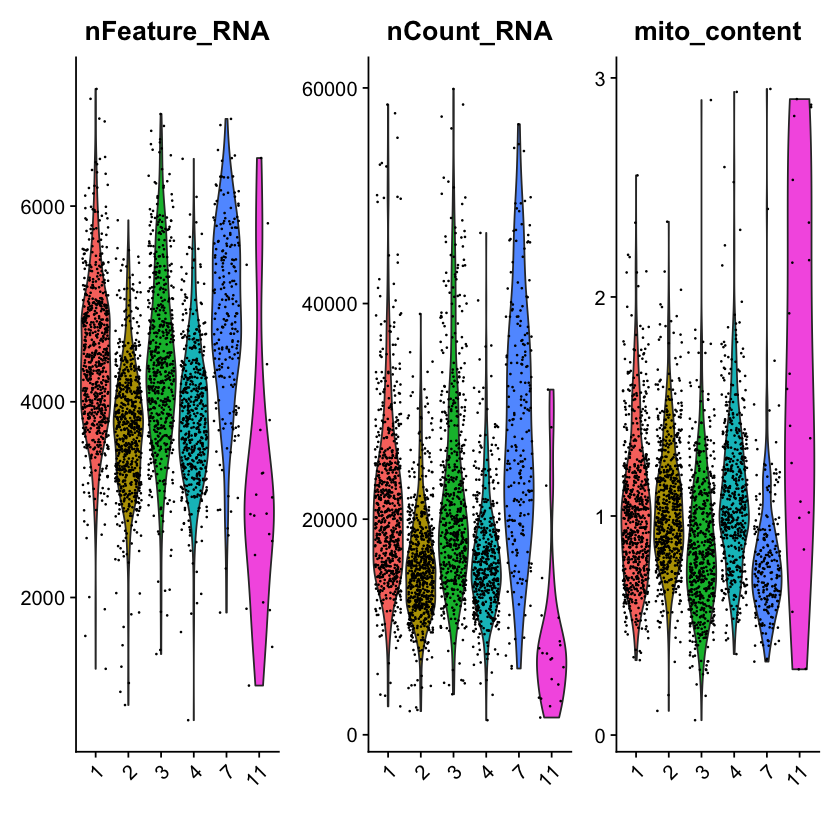

[1] "cocultAKFib"


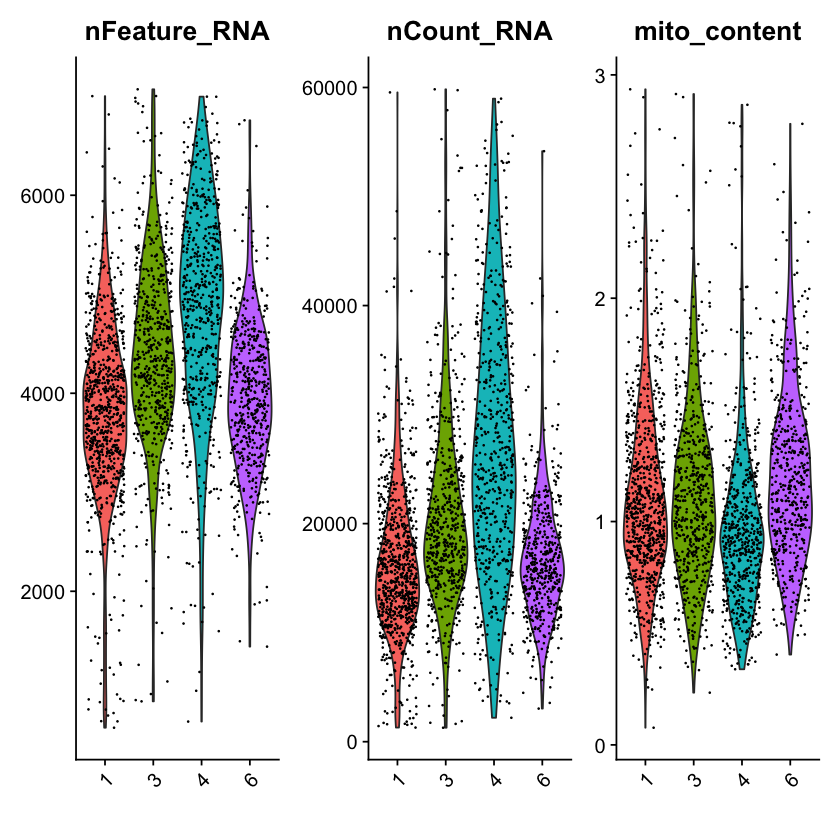

[1] "cocultAKPFib"


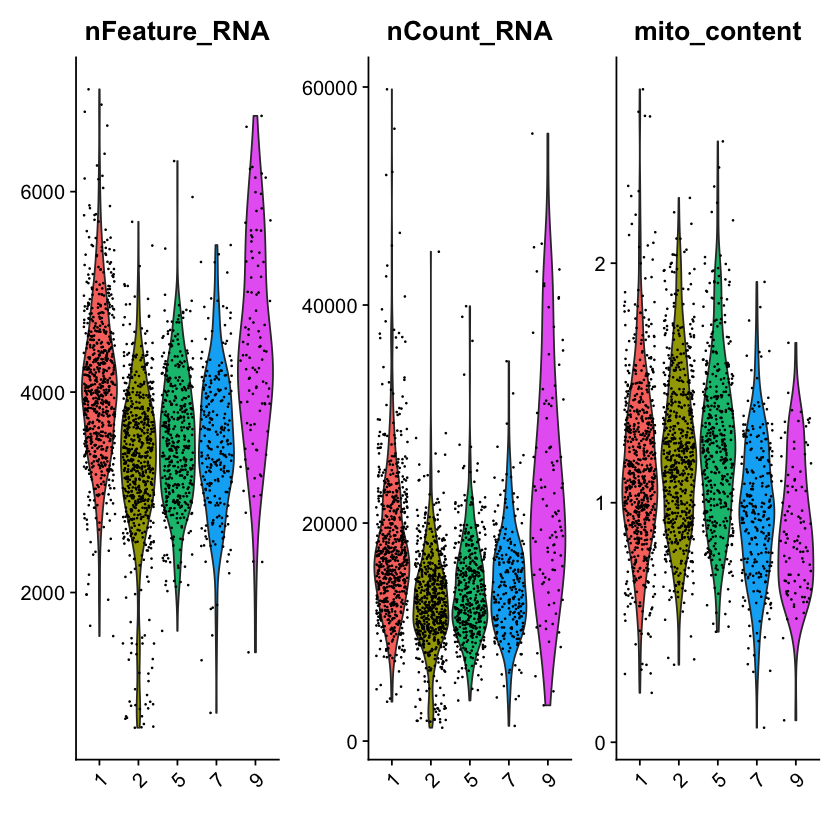

[1] "monoFib"


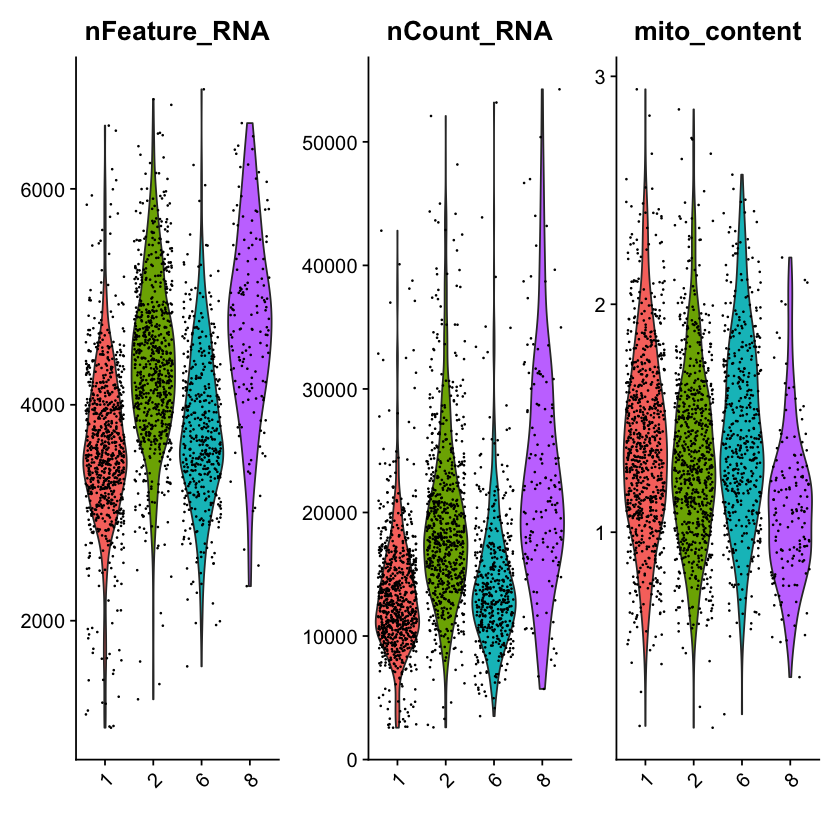

[1] "cocultWTMacFib"


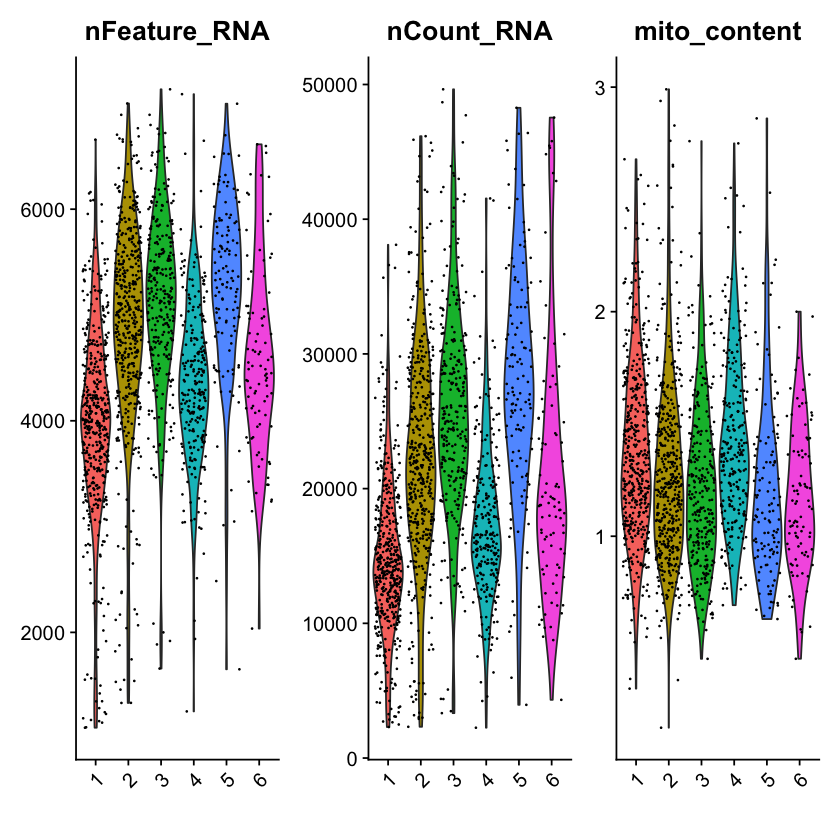

[1] "cocultAMacFib"


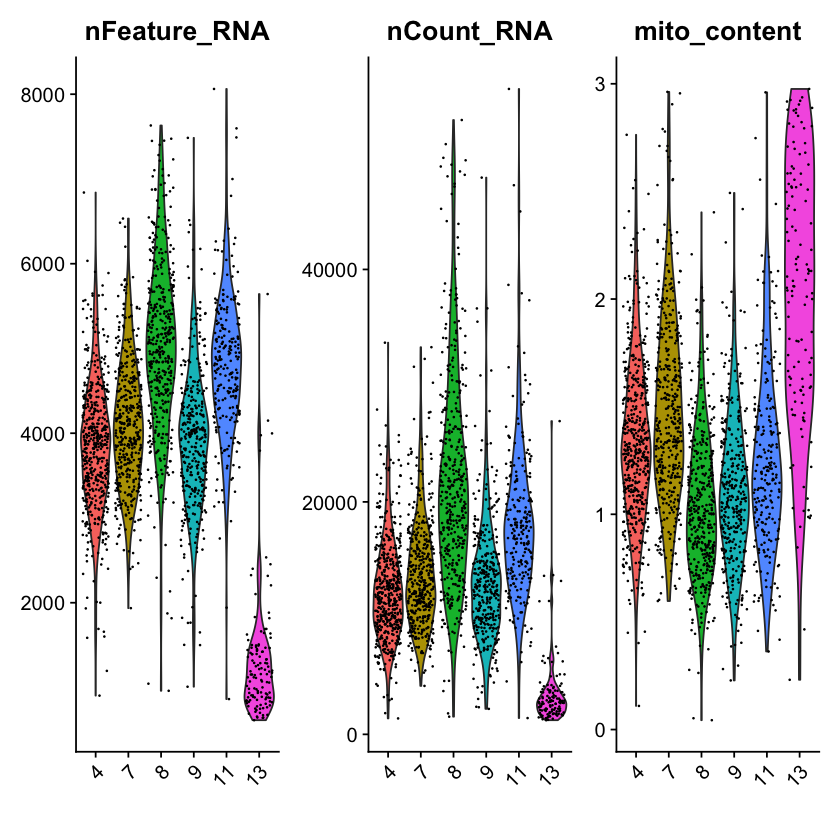

[1] "cocultAKMacFib"


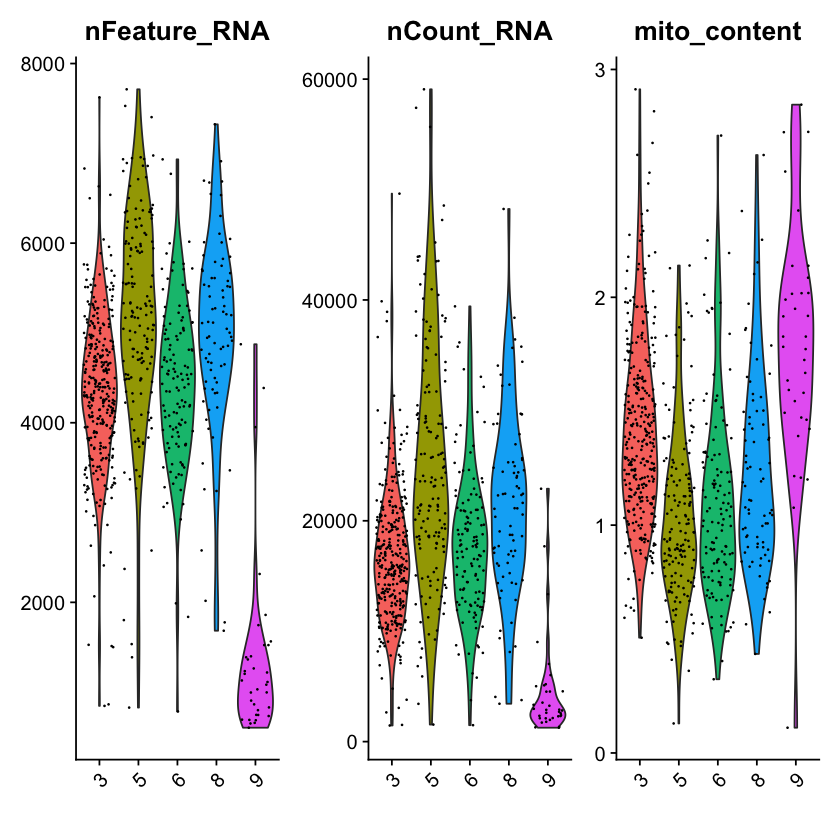

[1] "cocultAKPMacFib"


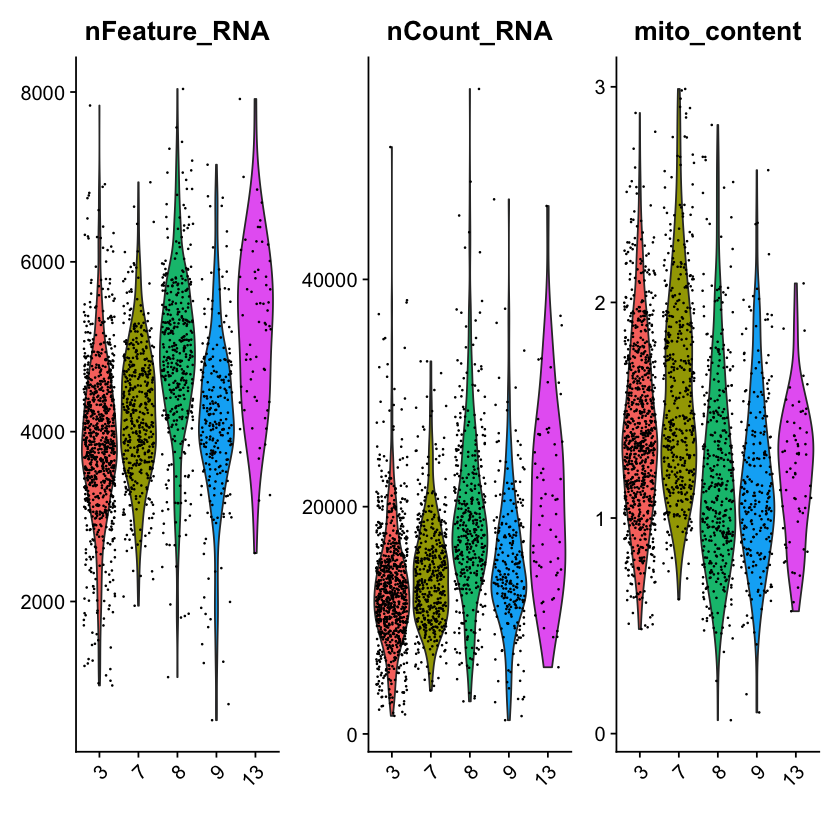

[1] "cocultMacFib"


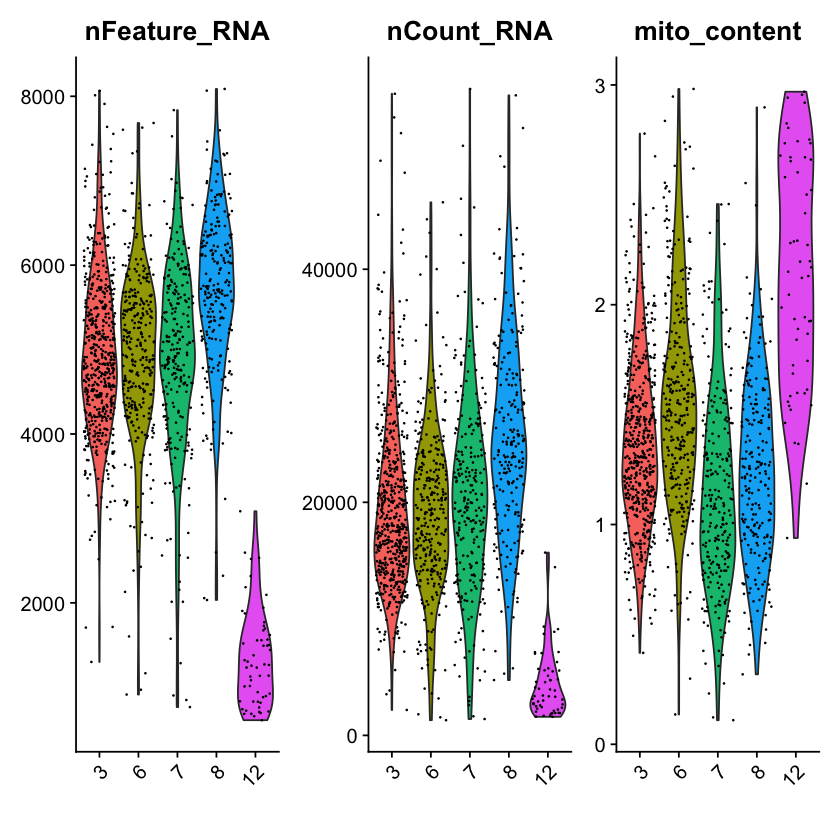

[1] "WTorg_CD34hi"


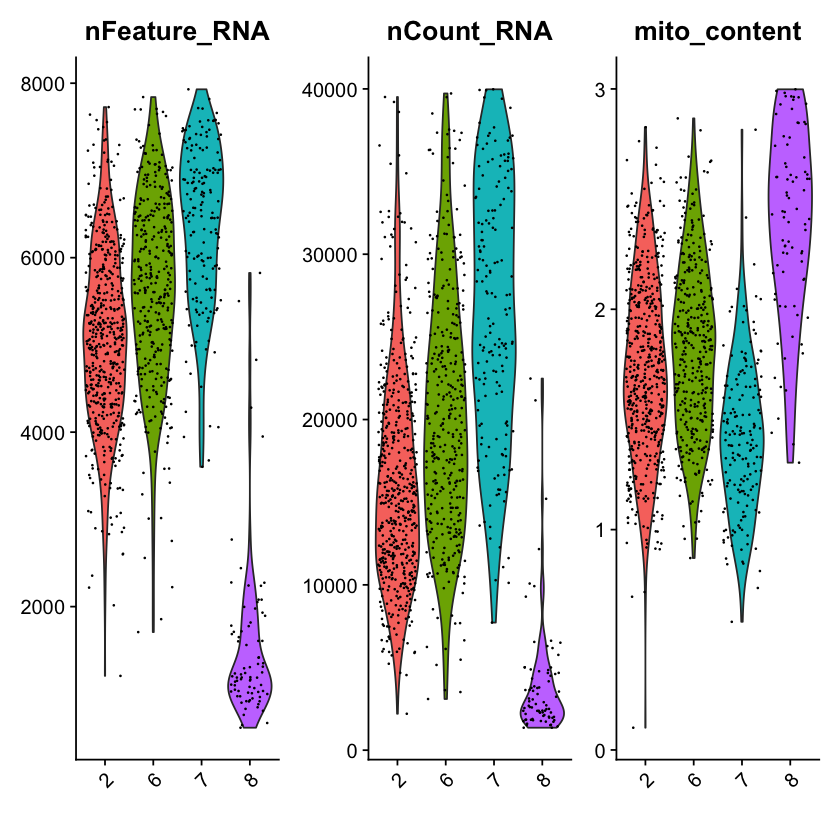

[1] "WTorg_CD34hilo"


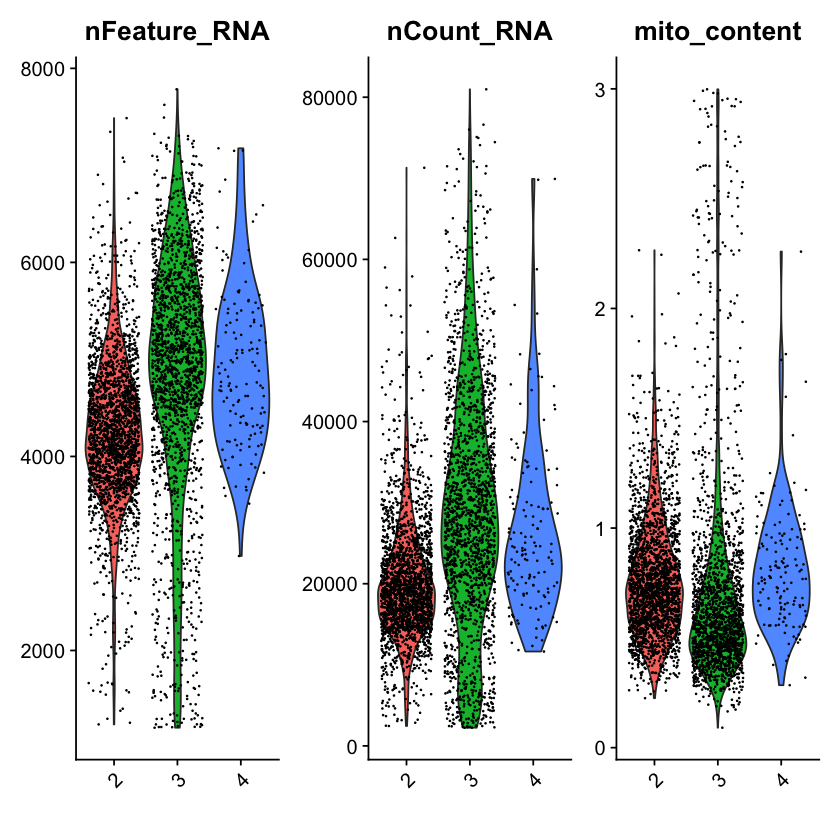

[1] "WTorg_CD34lo"


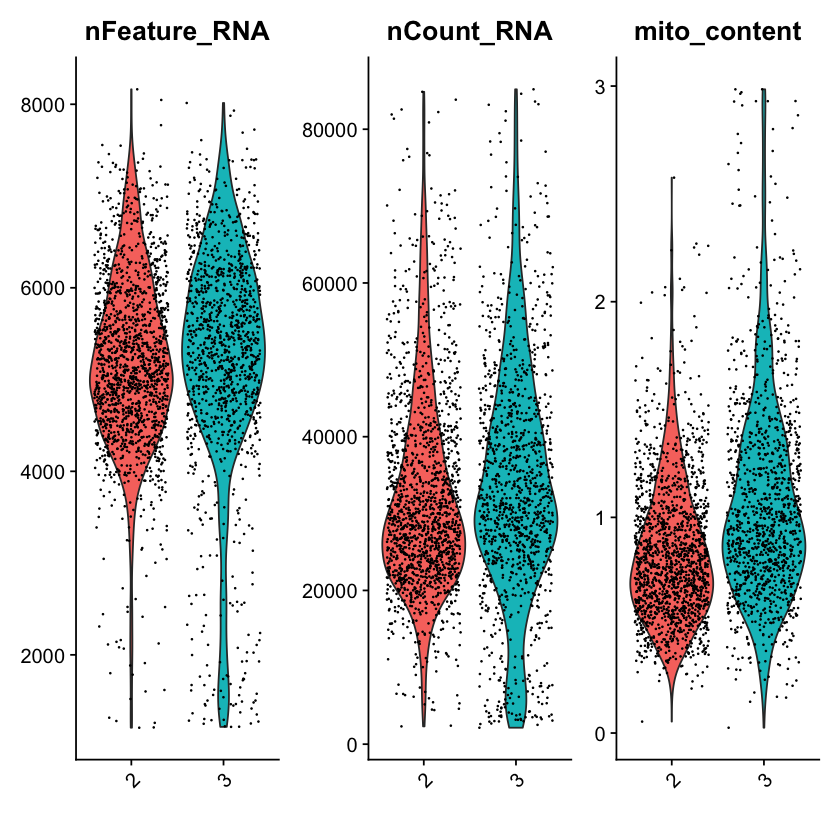

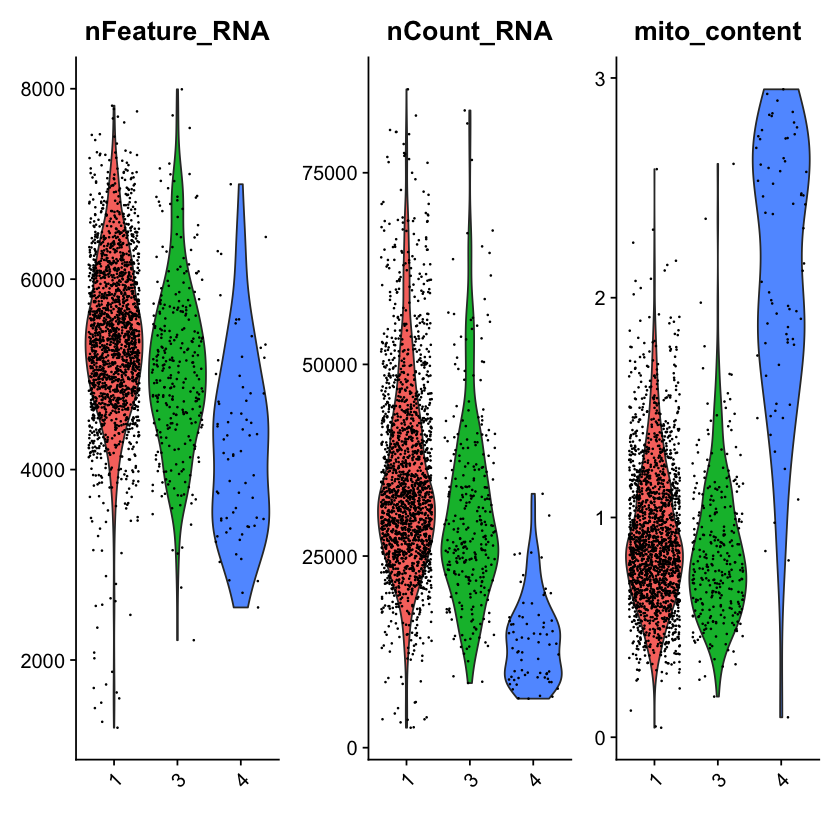

In [49]:
for (i in 1:length(INTfibF1_list)) {
  print(INTfibF1_list[[i]]@project.name)
  print(VlnPlot(INTfibF1_list[[i]], features = c("nFeature_RNA", "nCount_RNA",
                                                "mito_content"),
                ncol = 3, assay = "RNA", group.by = "seurat_clusters", stack = FALSE) &
        xlab(""))
  }

In [ ]:
for (i in 1:length(INTfibF1_list)) {
  print(VlnPlot(INTfibF1_list[[i]], features = c("nFeature_RNA"),
                ncol = 1, assay = "RNA", group.by = "orig.ident", stack = FALSE) &
          xlab("") &
          geom_hline(yintercept = c(2000, 7600), col="red")
        )
    # print(VlnPlot(INTfibF1_list[[i]], features = c("nCount_RNA"),
    #             ncol = 1, assay = "RNA", group.by = "orig.ident", stack = FALSE) &
    #       xlab("") &
    #       geom_hline(yintercept = 2400, col="red")
    #     )
  }

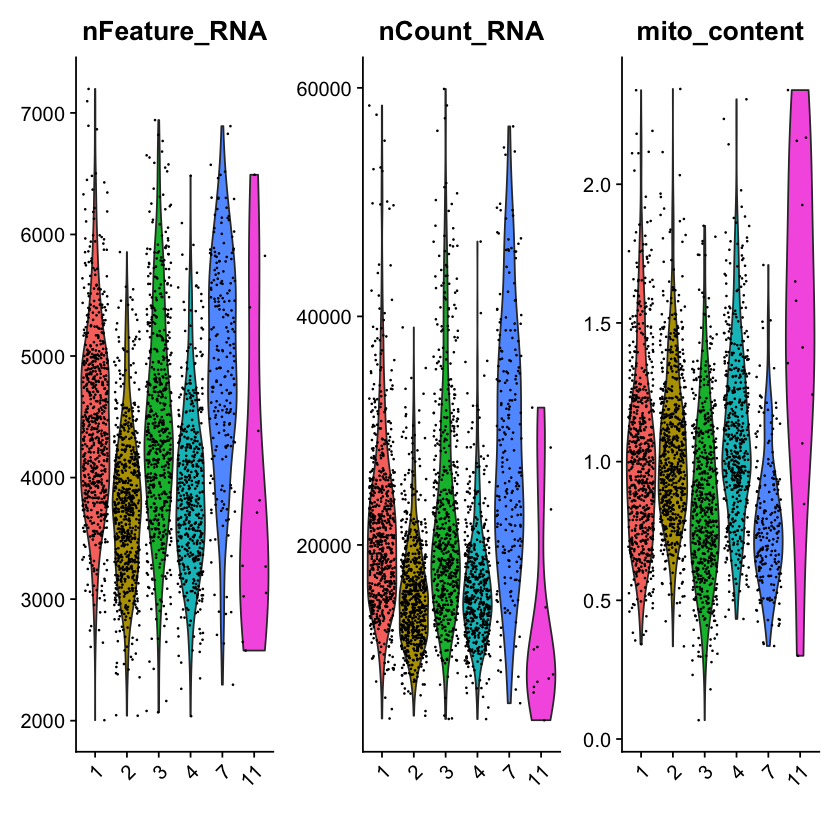

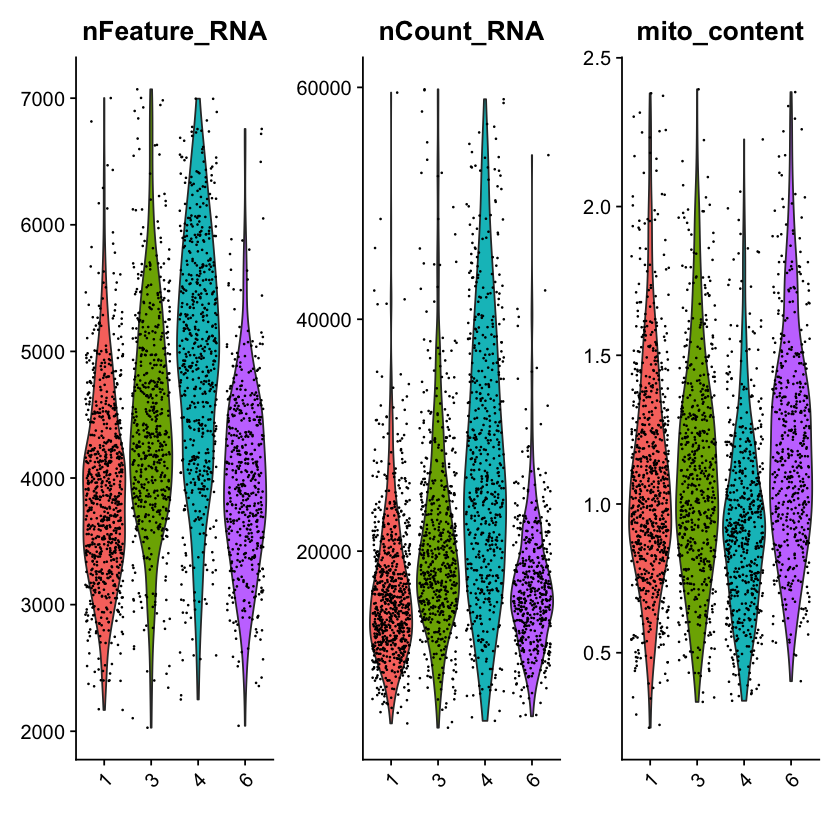

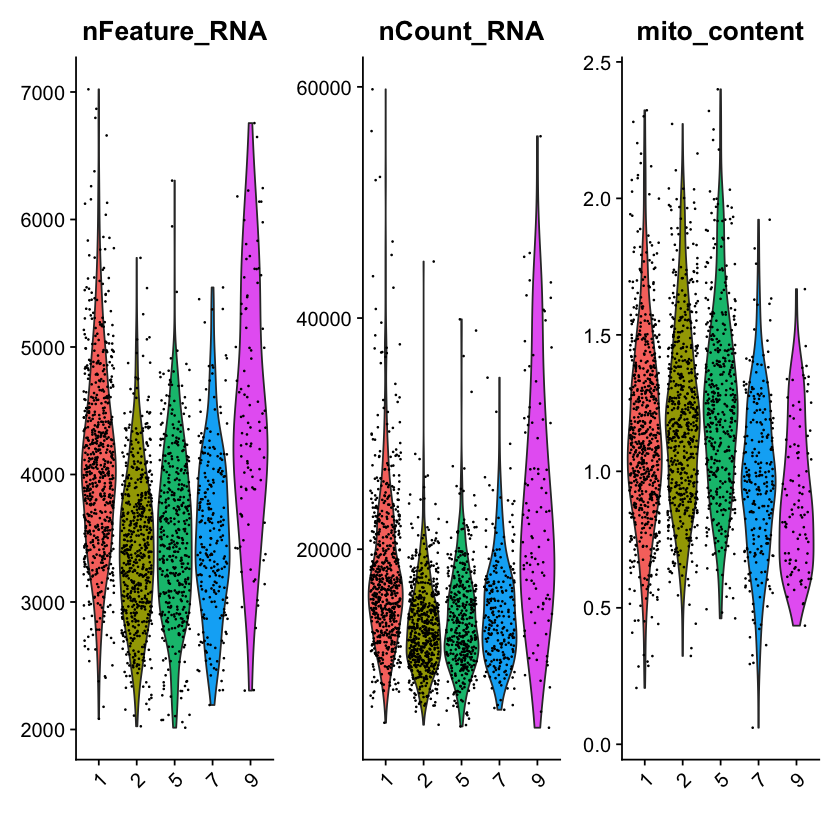

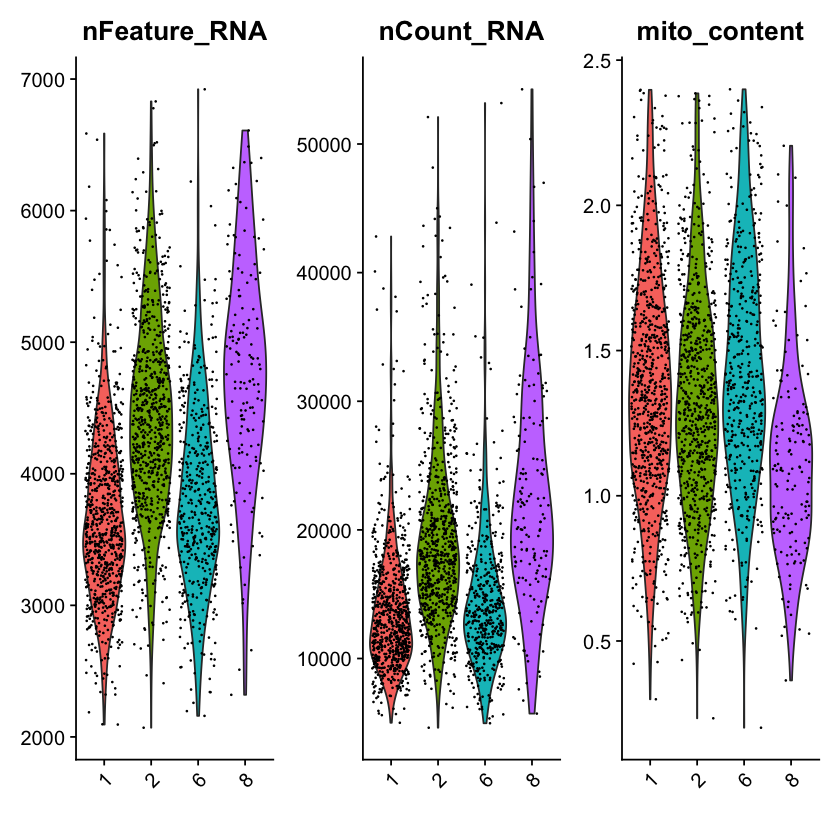

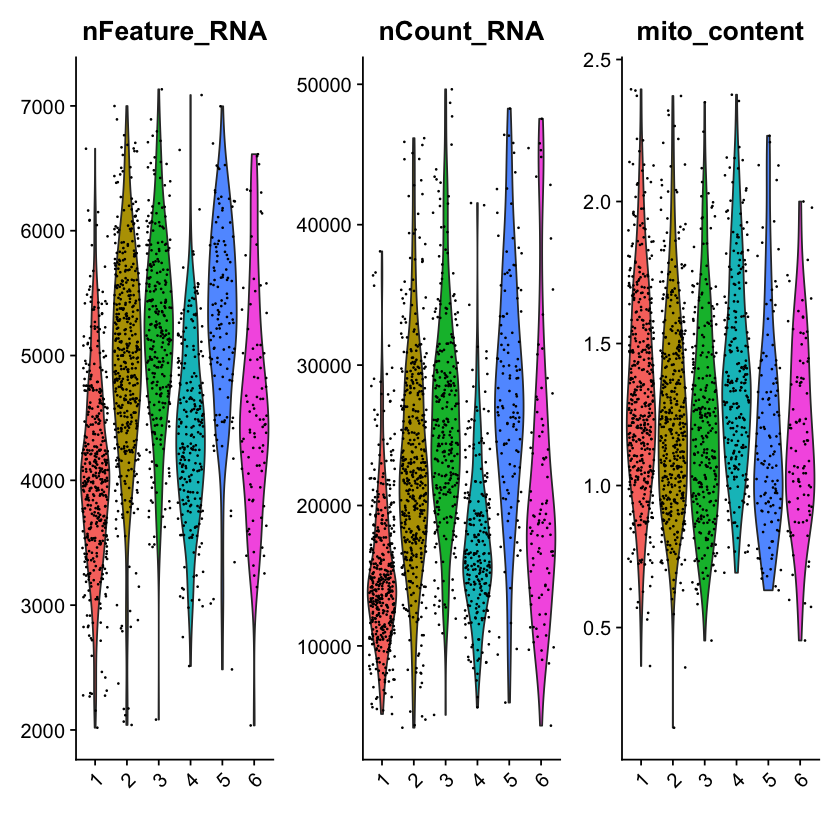

...

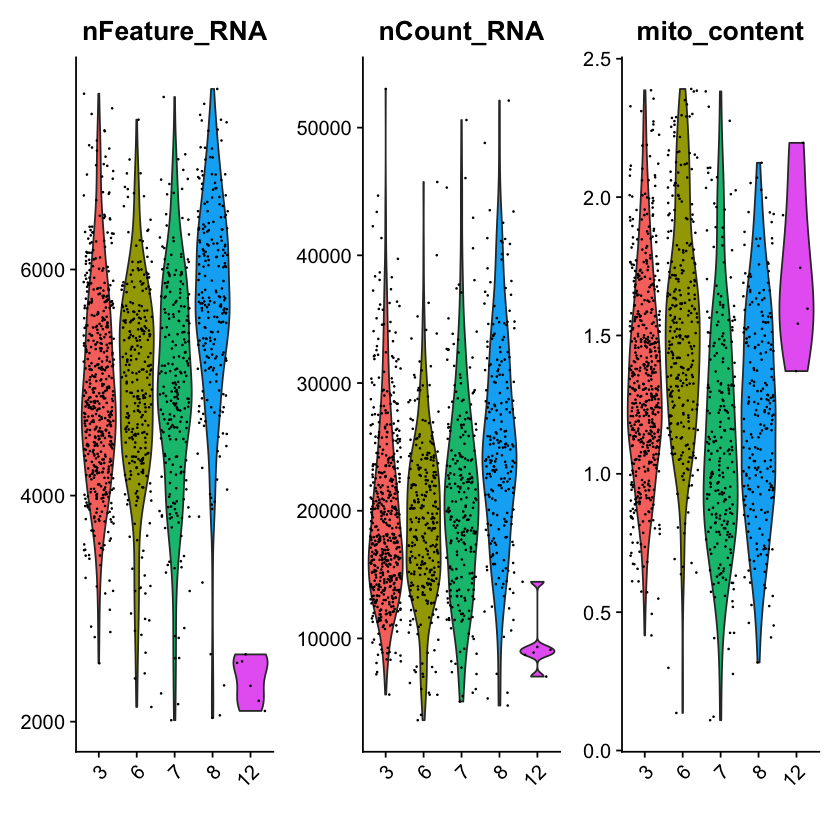

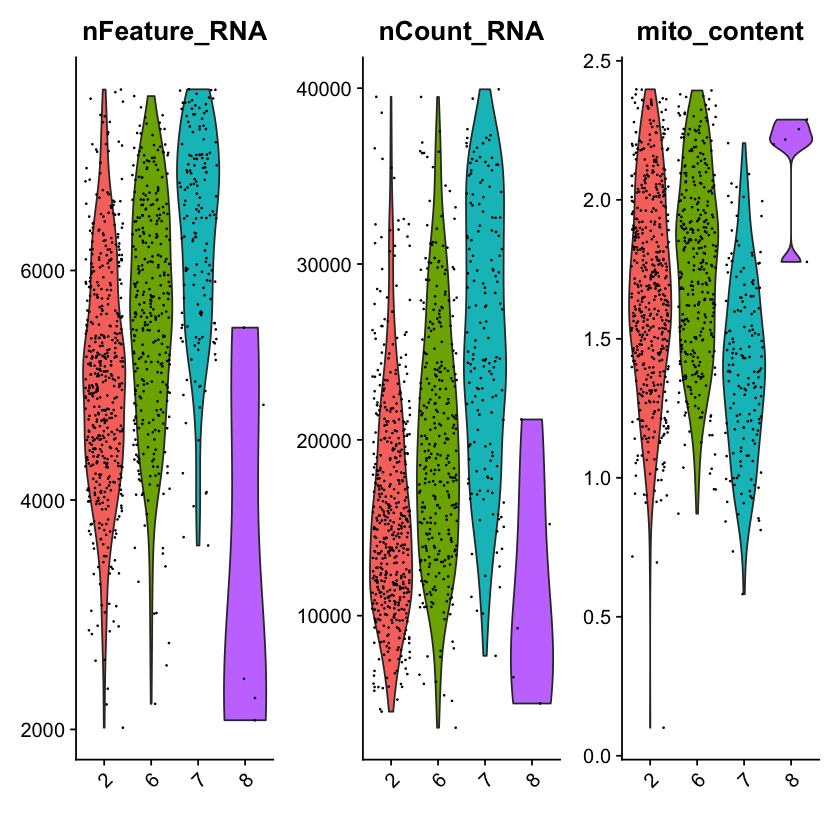

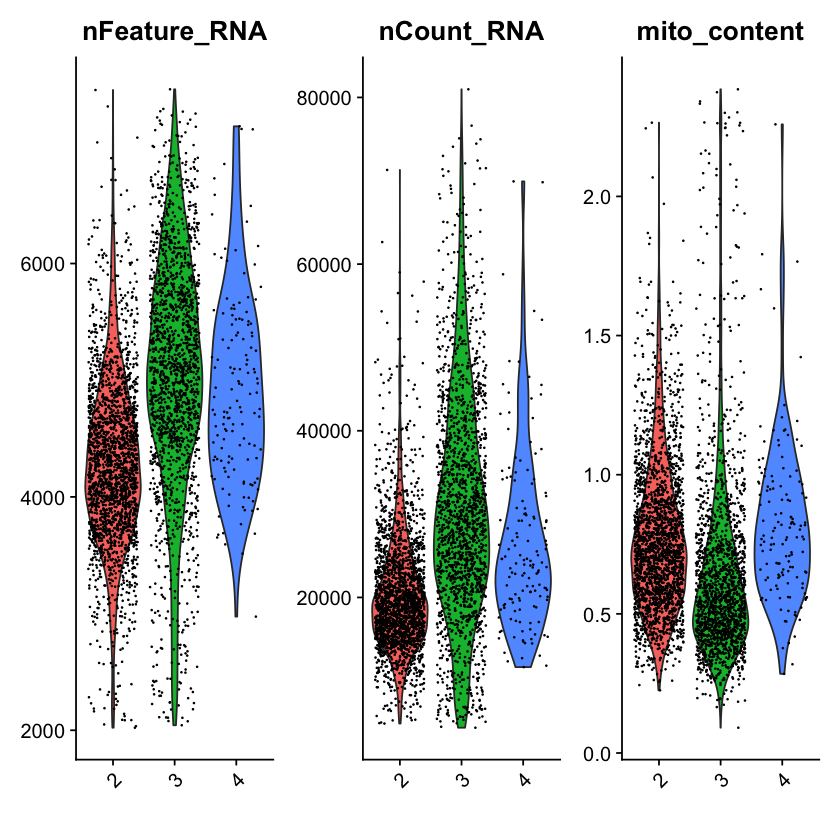

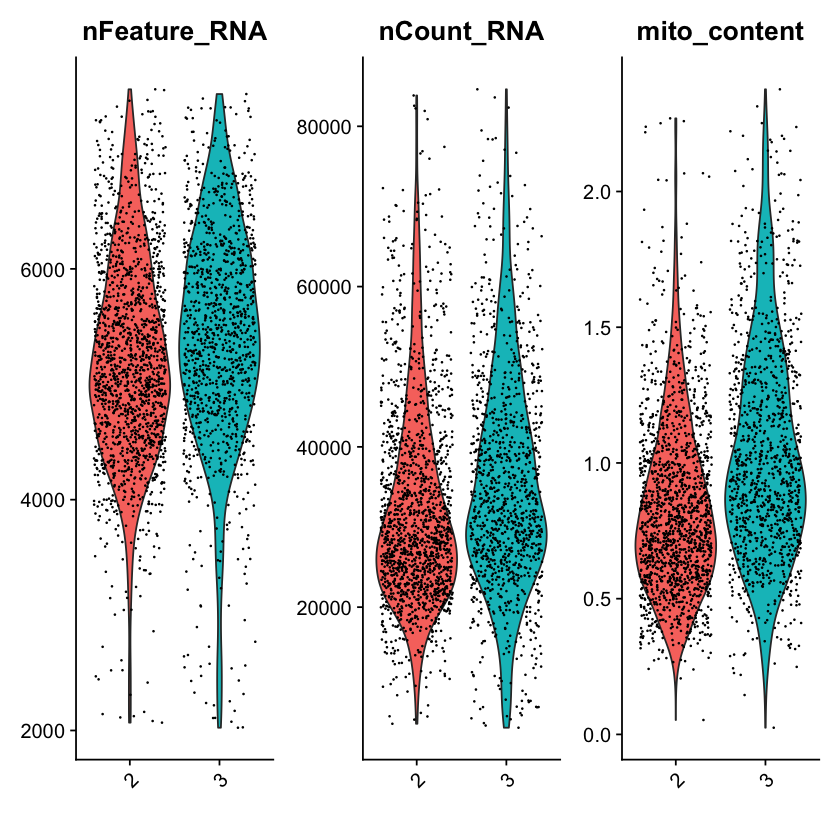

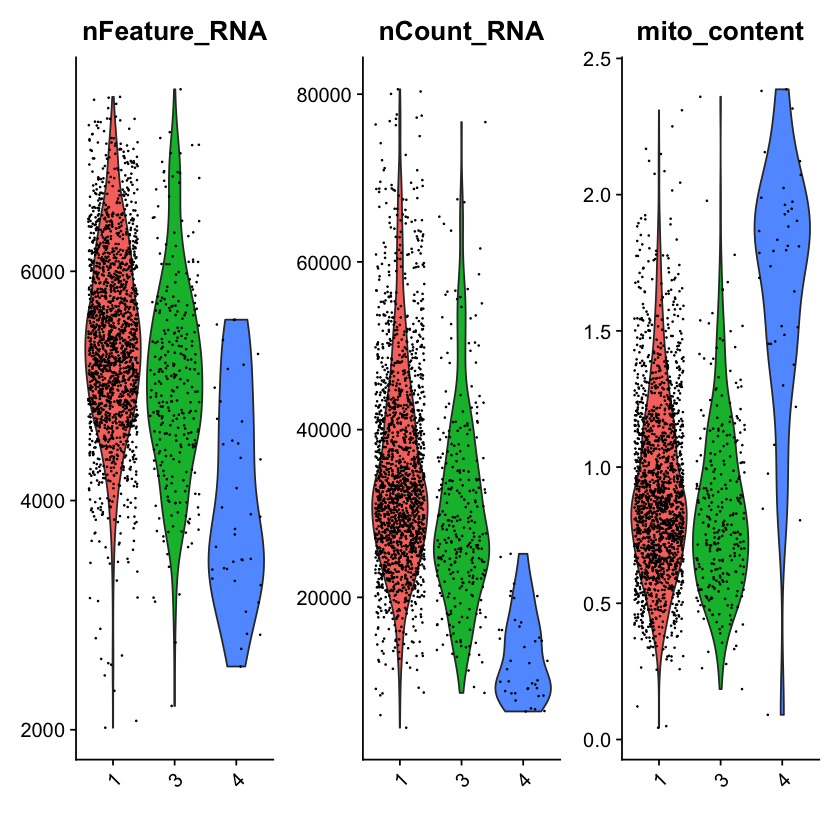

In [53]:
for (i in 1:length(INTfibF1_list)) {
  INTfibF1_list[[i]] <- subset(INTfibF1_list[[i]],
                             subset = mito_content<2.4 &
                                      nFeature_RNA>2000 &       
                                        nFeature_RNA<7600
                             )
    print(VlnPlot(INTfibF1_list[[i]], features = c("nFeature_RNA", "nCount_RNA",
                                               "mito_content"),
                ncol = 3, assay = "RNA", group.by = "seurat_clusters", stack = FALSE) &
        xlab(""))
  
}

Filtering low fibro expression cells:
Use the fibro markers and a similar approach tot hat used to filter INTepi cells with epithelial like marker expression.

We will use Dcn and Ptn only, for 2 reasons:
* If we use them all using &AND& se filter too many cells 
    * Using |OR| is too lenient on the other hand
* Vlnplots show that expression for a big number of cells in certain clusters is 0 
for some of the other genes. This does not happen to teh same degree for Dcn and Ptn in fibro clusters and Epcam in epi clusters.


In [55]:
fib_markers

[1] "Pdgfra" "Dcn"    "Ptn"    "C3"

In [59]:
for (i in 1:length(INTfibF1_list)) {
    print(INTfibF1_list[[i]]@project.name)
    print(dim(INTfibF1_list[[i]]))
    print(dim(subset(INTfibF1_list[[i]],
                    Pdgfra>0 & Dcn>0 & Ptn>0 & C3>0
                    )))
    print(dim(subset(INTfibF1_list[[i]],
                    Pdgfra>0 | Dcn>0 | Ptn>0 | C3>0
                    )))
    print(dim(subset(INTfibF1_list[[i]],
                    Dcn>0 & Ptn>0
                    )))
    print(dim(subset(INTfibF1_list[[i]],
                    Dcn>0 | Ptn>0
                    )))
}

[1] "cocultWTFib"
[1] 20073  2614
[1] 20073  1884
[1] 20073  2611
[1] 20073  2406
[1] 20073  2601
[1] "cocultAFib"
[1] 20041  2362
[1] 20041  1637
[1] 20041  2356
[1] 20041  2183
[1] 20041  2347
[1] "cocultAKFib"
[1] 19143  1978
[1] 19143  1481
[1] 19143  1973
[1] 19143  1802
[1] 19143  1968
[1] "cocultAKPFib"
[1] 19864  2068
[1] 19864  1503
[1] 19864  2066
[1] 19864  1915
[1] 19864  2063
[1] "monoFib"
[1] 17151  1571
[1] 17151  1051
[1] 17151  1571
[1] 17151  1391
[1] 17151  1569
[1] "cocultWTMacFib"
[1] 21464  1837
[1] 21464  1559
[1] 21464  1833
[1] 21464  1732
[1] 21464  1824
[1] "cocultAMacFib"
[1] 18717   656
[1] 18717   566
[1] 18717   655
[1] 18717   622
[1] 18717   650
[1] "cocultAKMacFib"
[1] 21446  1889
[1] 21446  1676
[1] 21446  1888
[1] 21446  1763
[1] 21446  1873
[1] "cocultAKPMacFib"
[1] 21442  1275
[1] 21442  1158
[1] 21442  1274
[1] 21442  1202
[1] 21442  1260
[1] "cocultMacFib"
[1] 19278   972
[1] 19278   927
[1] 19278   972
[1] 19278   951
[1] 19278   971
[1] "WTorg_

In [ ]:
copy_Seuratlist <- c()
for (i in 1:length(INTfibF1_list)) {
    copy_Seuratlist <- append(copy_Seuratlist,
                            subset(INTfibF1_list[[i]],
                                    Dcn>0 & Ptn>0
                                    )
                        )
}
for (i in 1:length(copy_Seuratlist)) {
    print(copy_Seuratlist[[i]]@project.name)
    print(dim(copy_Seuratlist[[i]]))
    print(VlnPlot(copy_Seuratlist[[i]], 
                    features = c("nFeature_RNA", "nCount_RNA",
                                "mito_content"),
                    ncol = 3, assay = "RNA", group.by = "seurat_clusters", 
                    stack = FALSE) &
        xlab(""))
}

In [ ]:
#Save object list before integration:
saveRDS(copy_Seuratlist,"../RData/INTfib_list.rds")

In [2]:
#Load object list before integration:
INTfib_list <- readRDS("../RData/INTfib_list.rds")

scDblFind (deprecated)

In [54]:
# library(scDblFinder)

ERROR: Error in library(scDblFinder): there is no package called ‘scDblFinder’


In [ ]:
# SCE_INTfibF1_list <- c()
# for (i in 1:length(INTfibF1_list)) {
#     SCE_INTfibF1_list <- append(SCE_INTfibF1_list,
#                                 as.SingleCellExperiment(INTfibF1_list[[i]], 
#                                     assay="RNA")
#                                 )
# }

# for (i in 1:length(SCE_INTfibF1_list)) {
#     scDblFinder(SCE_INTfibF1_list[[i]], 
#                 clusters=NULL, 
#                 nfeatures=2400#, 
#                 # samples=""
#                 )
# }


# INTfibF1_list <- c()
# for (i in c(1,3)) { #Obejcts with macs are first and third entries
#   INTfibF1_list <- append(INTfibF1_list, 
#                         c(
#                         subset(crctmeWT[[i]], idents = levels(
#                           crctmeWT[[i]]@active.ident)[startsWith(
#                                 levels(crctmeWT[[i]]@active.ident), "f")]),
#                         subset(crctmeA[[i]], idents = levels(
#                           crctmeA[[i]]@active.ident)[startsWith(
#                                 levels(crctmeA[[i]]@active.ident), "f")]),
#                         subset(crctmeAK[[i]], idents = levels(
#                           crctmeAK[[i]]@active.ident)[startsWith(
#                                 levels(crctmeAK[[i]]@active.ident), "f")]),
#                         subset(crctmeAKP[[i]], idents = levels(
#                           crctmeAKP[[i]]@active.ident)[startsWith(
#                                 levels(crctmeAKP[[i]]@active.ident), "f")]),
#                         subset(tmecontrols[[i]], idents = levels(
#                           tmecontrols[[i]]@active.ident)[startsWith(
#                                 levels(tmecontrols[[i]]@active.ident), "f")])
#                         )
#                         )
# }
# length(INTfibF1_list)

# Integration

First ensure normalisation of data makes sense (RNA assay properly normalised)

In [24]:
for (i in 1:length(INTfib_list)) {
    print(INTfib_list[[i]]@project.name)
    print(summary(as.data.frame(INTfib_list[[i]]@assays$RNA@data))[,1:3])
    #The scale.data slot is empty for the second seq run datasets!
}


[1] "cocultWTFib"
 AAACCCACAGCTTCCT-1 AAACCCAGTTCGAGCC-1 AAACGAAAGAAGGATG-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1573     Mean   :0.1607     Mean   :0.1572    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :5.6826     Max.   :5.9023     Max.   :6.1967    
[1] "cocultAFib"
 AAACCCACATCAGCTA-1 AAACCCAGTAGCTGCC-1 AAACCCAGTGAAGCGT-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1767     Mean   :0.1474     Mean   :0.1691    
 3rd Qu.:0.2865     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :6.4698     Max.   :6.9296     Max.   :6.2163    
[1] "cocultAKFib"
 AAACCCACACACCTAA-1 AAACCCATCGGTAAGG-1 AAAGAACAGTTTCTTC-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000    

In [69]:
for (i in 1:length(INTfib_list)) {
    INTfib_list[[i]] <- NormalizeData(
                            INTfib_list[[i]],
                            assay="RNA",
                            normalization.method = "LogNormalize",
                            scale.factor = 10000
    )
    print(summary(as.data.frame(INTfib_list[[i]]@assays$RNA@data))[,1:3])
}

 AAACCCACAGCTTCCT-1 AAACCCAGTTCGAGCC-1 AAACGAAAGAAGGATG-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1573     Mean   :0.1607     Mean   :0.1572    
 3rd Qu.:0.0000     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :5.6826     Max.   :5.9023     Max.   :6.1967    
 AAACCCACATCAGCTA-1 AAACCCAGTAGCTGCC-1 AAACCCAGTGAAGCGT-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.0000     Median :0.0000     Median :0.0000    
 Mean   :0.1767     Mean   :0.1474     Mean   :0.1691    
 3rd Qu.:0.2865     3rd Qu.:0.0000     3rd Qu.:0.0000    
 Max.   :6.4698     Max.   :6.9296     Max.   :6.2163    
 AAACCCACACACCTAA-1 AAACCCATCGGTAAGG-1 AAAGAACAGTTTCTTC-1
 Min.   :0.0000     Min.   :0.0000     Min.   :0.0000    
 1st Qu.:0.0000     1st Qu.:0.0000     1st Qu.:0.0000    
 Median :0.000

Then use rPCA integration:
* SCT norm the individual datasets
    * Sanity check they have already been normalised
* Integrate data

In [26]:
for (i in 1:length(INTfib_list)) {
    print(INTfib_list[[i]]@project.name)
    print(INTfib_list[[i]]@assays)
}

[1] "cocultWTFib"
$RNA
Assay data with 20867 features for 2406 cells
Top 10 variable features:
 Tff3, Ccl5, Prap1, Cxcl10, Tagln, Spink4, Acta1, Agr2, Acta2, Wfdc17 

$SCT
SCTAssay data with 20073 features for 2406 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Epcam, Krt18, Lgals4, Krt8, Saa3, Spp1, Lgals2, Krt19, Wfdc17, Hp 

[1] "cocultAFib"
$RNA
Assay data with 20923 features for 2183 cells
Top 10 variable features:
 Spink4, Tff3, Ccl5, Agr2, Tagln, Acta1, Cxcl10, Reg4, Wfdc17, Acta2 

$SCT
SCTAssay data with 20041 features for 2183 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Saa3, Epcam, Krt18, Spp1, Gpx2, Hp, Dcn, Wfdc17, Ifitm1, Sprr1a 

[1] "cocultAKFib"
$RNA
Assay data with 19919 features for 1802 cells
Top 10 variable features:
 Ccl5, Sprr1a, Spink4, Cxcl10, Wfdc17, Tff3, Slpi, Agr2, Pla2g2a, Car1 

$SCT
SCTAssay data with 19143 features for 1802 cells, and 1 SCTModel(s) 
Top 10 variable features:
 Dcn, Saa3, Ccl2, Gpx2, Spp1, Ifitm1, Ifi27l2a, Agr2, Ccl5, Sprr

In [30]:
# for (i in 1:length(INTfib_list)) {
#   INTfib_list[[i]] <- FindVariableFeatures(INTfib_list[[i]],
#                                             selection.method = "vst",
#                                             nfeatures = 10000, assay = "RNA")
# }
INTfib_feats <- SelectIntegrationFeatures(object.list=INTfib_list, 
                                          nfeatures =3000)
INTfib_list <- PrepSCTIntegration(object.list=INTfib_list, 
                                  anchor.features=INTfib_feats)
INTfib_list <- lapply(X = INTfib_list,
                      FUN = RunPCA,
                      features = INTfib_feats,
                      assay = "SCT", reduction.name="pca")

PC_ 1 
Positive:  Dcn, Saa3, Ptn, Lcn2, Ifitm3, Mgp, Rasl11a, Cd302, Hp, Mt1 
	   Tmem176b, Il33, Lbp, Cxcl12, Timp1, Ccl7, Ccl2, Gas6, C3, Igfbp7 
	   Cebpb, Cebpd, Mt2, Serpine2, Ifitm2, Pdgfra, Spp1, Cxcl1, Col3a1, Tmem176a 
Negative:  Lgals4, Cldn7, Cystm1, Lgals2, Krt7, S100a14, S100a6, Crip1, Tmsb10, Pglyrp1 
	   Ezr, Spint2, Gsta4, S100a11, Anxa3, S100a10, Lgals3, Mgst3, Tmsb4x, Ifi27l2b 
	   Tpd52, AA467197, Sfn, Gm43305, Actg1, Serpinb1a, Fdps, Dstn, Actb, Anxa4 
PC_ 2 
Positive:  Ifitm1, Ifi27l2a, Ifitm3, Ly6c1, Hgf, Ifitm2, Ctsl, Sod2, Cebpd, Slpi 
	   S100a4, Ccl2, Grem1, Hp, Mt1, Mt2, Gdpd2, Vcan, Cxcl1, H2bc4 
	   Ifitm6, Saa3, Isg15, Ly6a, Prkg2, Cebpb, Igfbp4, Ereg, Fos, Tslp 
Negative:  Dcn, Ptn, Pclaf, Cthrc1, Stmn1, Birc5, Tyms, Rbp1, Ube2c, Top2a 
	   Rhox5, Spc24, Csrp2, Rad51ap1, Tk1, Dut, Smc2, Hmgb2, Acta2, Syce2 
	   Cenpm, Cdk1, Spc25, Cenpa, Dlk1, Atad2, Ptgis, Cenpw, Ccne1, Pcna 
PC_ 3 
Positive:  Dcn, Gas6, Lbp, Saa3, Lcn2, Sfrp1, Pdgfra, Wfdc17, Ptn, Clu 


In [31]:
INTfib_anchors <- FindIntegrationAnchors(INTfib_list, normalization.method = "SCT",
                                        anchor.features = INTfib_feats,
                                        reduction = "rpca", k.anchor = 12)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 12287 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 8309 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 7772 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 8360 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 7945 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 9380 anchors

Projecting new data onto SVD

Proje

Integration dies at min10 (Merging dataset 8 9 6 7 10 into 1 2 4 3 11 12 13 5) 
with `Error: vector memory exhausted (limit reached?)` when using 4k Integration
features.
Lowering features to XXXX works.

In [32]:
INTfib <- IntegrateData(anchorset = INTfib_anchors, 
                                normalization.method = "SCT")

Merging dataset 7 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 9 into 8

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 12 into 11

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 3 into 1 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 7 into 8 9

Extracting anchors for merged samples

Finding integration vectors

Finding 

In [35]:
print(INTfib)
INTfib@meta.data

An object of class Seurat 
55548 features across 24431 samples within 3 assays 
Active assay: integrated (3000 features, 3000 variable features)
 2 other assays present: RNA, SCT


,orig.ident,nCount_RNA,nFeature_RNA,mito_content,rfp_content,gfp_content,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,Phase,old.ident,CCDiff,SCT_snn_res.0.6,seurat_clusters,SCT_snn_res.0.1
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
AAACCCACAGCTTCCT-1_1,cocultWTFib,10761,3163,0.9478673,0.009292817,0,17183,3206,0.091728182,-0.035993356,Cycling,cocultWTFib,0.127721538,4,4,NA
AAACCCAGTTCGAGCC-1_1,cocultWTFib,15485,3811,1.2334517,0.000000000,0,17347,3811,0.047732471,-0.003213944,Cycling,cocultWTFib,0.050946414,2,2,NA
AAACGAAAGAAGGATG-1_1,cocultWTFib,16689,3775,1.2702978,0.000000000,0,17508,3775,0.048828818,-0.047011565,Cycling,cocultWTFib,0.095840383,2,2,NA
AAACGAACACCAGCTG-1_1,cocultWTFib,29829,5235,0.8917496,0.003352442,0,18905,5016,0.318041909,0.452043743,Highly cycling,cocultWTFib,-0.134001834,7,7,NA
AAACGAACACCGTGCA-1_1,cocultWTFib,14958,3741,1.0028079,0.000000000,0,17218,3741,0.036146193,-0.003748593,Cycling,cocultWTFib,0.039894786,2,2,NA
AAACGAACATACTTTC-1_1,cocultWTFib,29352,5383,1.2673753,0.003406923,0,19013,5171,0.082674485,0.010579537,Cycling,cocultWTFib,0.072094948,2,2,NA
AAACGCTCACAGCCAC-1_1,cocultWTFib,25127,4764,1.0148446,0.000000000,0,18820,4739,0.074618720,0.042586265,Cycling,cocultWTFib,0.032032455,1,1,NA
AAACGCTCATGACTAC-1_1,cocultWTFib,10341,3156,0.6865874,0.000000000,0,17141,3217,0.086064068,0.003735132,Cycling,cocultWTFib,0.082328935,3,3,NA
AAACGCTGTATCCCAA-1_1,cocultWTFib,16832,4249,1.0278042,0.000000000,0,17481,4247,0.087132113,-0.014986930,Cycling,cocultWTFib,0.102119043,2,2,NA


PC_ 1 
Positive:  Dcn, Ptn, Rbp1, Igfbp5, Il33, Sfrp1, Gas6, Tmem176b, Ptgis, Rhox5 
	   Dlk1, Cthrc1, Pdgfra, Mgp, Rpl18, Csrp2, Rps11, Rpl22l1, Wfdc17, Lbp 
	   Fabp5, Pclaf, Rpsa-ps10, Pdlim4, Cd34, Fau, Stmn1, Timp3, Birc5, Tyms 
Negative:  Ifitm1, Ifi27l2a, Ifitm3, Hgf, Ly6c1, S100a4, Ctsl, Sod2, Ifitm2, Prkg2 
	   Cebpd, Vcan, Ereg, Ccl2, Gdpd2, Slpi, Grem1, Isg15, H2bc4, Ppp1r14a 
	   Ifitm6, Tslp, Mt2, Cxcl1, Gucy1b1, Tmem167, Serpina3i, Adamts1, Gm28710, Lmo4 
PC_ 2 
Positive:  Spp1, Tagln, Acta2, Lgals1, Tnc, Tyms, Pclaf, Prkg2, Csrp2, Pmepa1 
	   Oaf, Cthrc1, Stmn1, Inhba, Mmp9, Birc5, Actg2, Tnfrsf12a, Tgfb1, Ass1 
	   Dut, Cald1, Myl9, Smc2, Ranbp1, Ube2c, Top2a, Cdk1, Rad51ap1, Spc24 
Negative:  Saa3, Dcn, Gas6, Lcn2, Lbp, Cd302, Pdgfra, C3, Hp, Wfdc17 
	   Sfrp1, Tmem176b, Rasl11a, Abi3bp, Ier3, Wnt4, Ptn, Mgst1, Cxcl12, Igfbp5 
	   Il33, Clu, Abcc3, Tmem176a, Cebpd, Adamts5, Mt1, Hspb1, Hsd11b1, Camp 
PC_ 3 
Positive:  Bsg, Fam162a, P4ha2, Sparc, Timp3, Col3a1, Col1a1, 

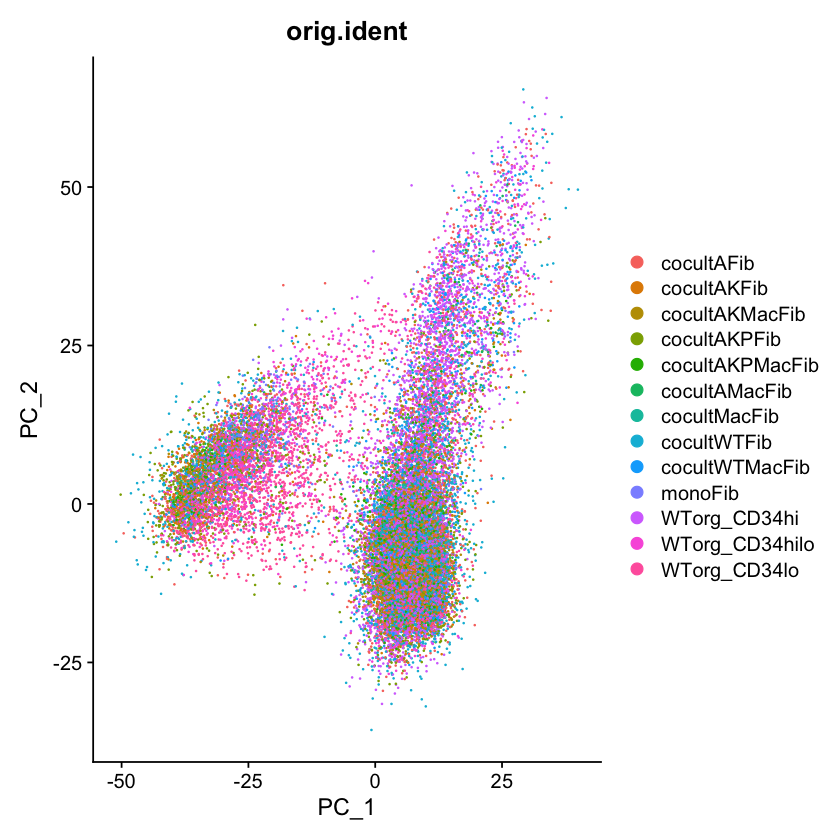

In [37]:
INTfib <- RunPCA(INTfib, assay="integrated", reduction.name="pcaFIB")
DimPlot(INTfib, reduction = "pcaFIB", group.by = "orig.ident", shuffle = TRUE)

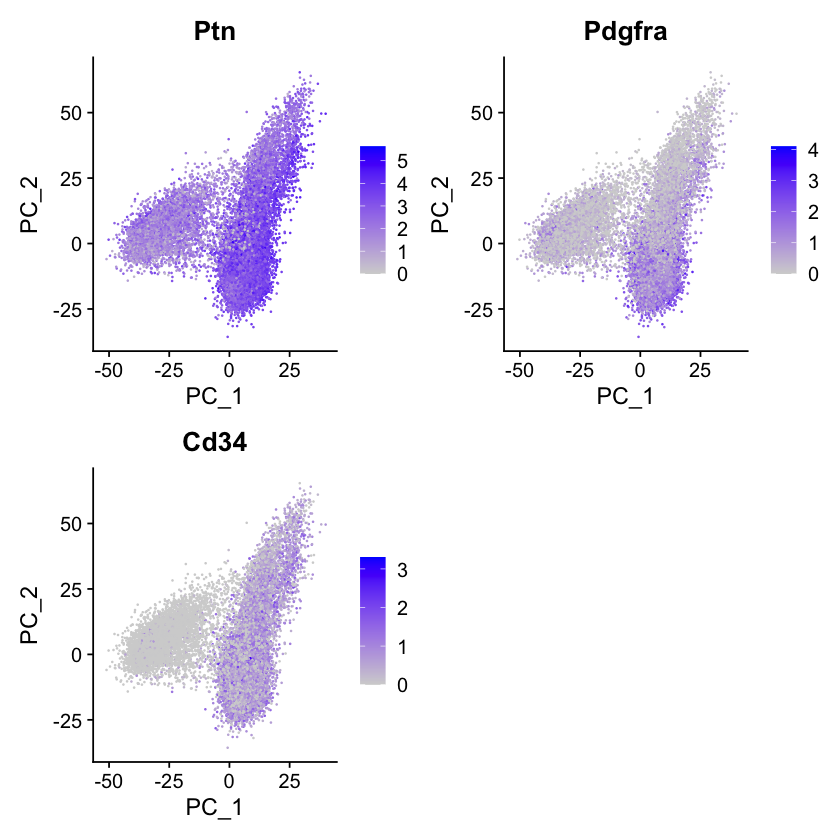

In [41]:
INTfib@active.assay <- "RNA"
FeaturePlot(INTfib, features = c("Ptn","Pdgfra", "Cd34"))
INTfib@active.assay <- "integrated"

In [70]:
#Popoulate scale.data slot on  RNA assay from the normalised values in @data
INTfib <- ScaleData(INTfib, features=rownames(INTfib@assays$SCT), assay="RNA")

Centering and scaling data matrix



# Condition DE

In [46]:
INTfib <- SetIdent(INTfib, value="orig.ident")
levels(INTfib@active.ident)

[1] "cocultWTFib"     "cocultAFib"      "cocultAKFib"     "cocultAKPFib"   
 [5] "monoFib"         "cocultWTMacFib"  "cocultAMacFib"   "cocultAKMacFib" 
 [9] "cocultAKPMacFib" "cocultMacFib"    "WTorg_CD34hi"    "WTorg_CD34hilo" 
[13] "WTorg_CD34lo"

In [47]:
gDE_INTfib_orig <- FindAllMarkers(
                    INTfib, assay = "RNA",
                    min.pct = 0.1, only.pos = FALSE, test.use = "wilcox", 
                    random.seed = 12)
gDE_INTfib_orig

Calculating cluster cocultWTFib

Calculating cluster cocultAFib

Calculating cluster cocultAKFib

Calculating cluster cocultAKPFib

Calculating cluster monoFib

Calculating cluster cocultWTMacFib

Calculating cluster cocultAMacFib

Calculating cluster cocultAKMacFib

Calculating cluster cocultAKPMacFib

Calculating cluster cocultMacFib

Calculating cluster WTorg_CD34hi

Calculating cluster WTorg_CD34hilo

Calculating cluster WTorg_CD34lo



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Uba52,0,1.7985560,1.000,0.971,0,cocultWTFib,Uba52
Nme2,0,1.1757125,0.902,0.419,0,cocultWTFib,Nme2
Gm10076,0,1.0471177,0.999,0.981,0,cocultWTFib,Gm10076
Atp5l,0,1.0094115,0.994,0.884,0,cocultWTFib,Atp5l
Sec61g,0,1.0092487,0.980,0.797,0,cocultWTFib,Sec61g
Serf2,0,0.8638350,1.000,0.998,0,cocultWTFib,Serf2
Gstp1,0,0.7707281,0.970,0.809,0,cocultWTFib,Gstp1
Atp5g2,0,0.7497334,0.855,0.432,0,cocultWTFib,Atp5g2
Cox6c,0,0.7313564,1.000,0.999,0,cocultWTFib,Cox6c


In [74]:
saveRDS(gDE_INTfib_orig,"../RData/gDE_INTfib_orig.rds")

In [59]:
gDE_INTfib_orig_n6 <- gDE_INTfib_orig %>% group_by(cluster) %>% slice_max(n=6, order_by = c(abs(avg_log2FC)))
gDE_INTfib_orig_n6

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,-2.4672369,0.974,0.987,0.000000e+00,cocultWTFib,CT010467.1
0.000000e+00,1.7985560,1.000,0.971,0.000000e+00,cocultWTFib,Uba52
0.000000e+00,1.1757125,0.902,0.419,0.000000e+00,cocultWTFib,Nme2
3.971288e-119,-1.0755782,0.856,0.921,1.070778e-114,cocultWTFib,Neat1
0.000000e+00,1.0471177,0.999,0.981,0.000000e+00,cocultWTFib,Gm10076
0.000000e+00,1.0094115,0.994,0.884,0.000000e+00,cocultWTFib,Atp5l
0.000000e+00,-2.3519359,0.977,0.987,0.000000e+00,cocultAFib,CT010467.1
6.854489e-188,1.1450080,0.705,0.453,1.848176e-183,cocultAFib,Il33
0.000000e+00,1.0577086,0.897,0.646,0.000000e+00,cocultAFib,Egln1


In [66]:
unique(gDE_INTfib_orig_n6$gene)
print(length(unique(gDE_INTfib_orig_n6$gene)))

[1] "CT010467.1" "Uba52"      "Nme2"       "Neat1"      "Gm10076"   
 [6] "Atp5l"      "Il33"       "Egln1"      "Igfbp5"     "Higd1a"    
[11] "Eno1"       "Spp1"       "Tagln"      "Krt18"      "Acta2"     
[16] "Tnfrsf12a"  "Wfdc17"     "Tmsb10"     "Rps28"      "Hp"        
[21] "Lcn2"       "Fam162a"    "Pgk1"       "Ccl2"       "Isg15"     
[26] "Irf7"       "Ifi27l2a"   "Timp3"      "Ccl5"       "Cxcl10"    
[31] "mt-Atp6"    "Txnip"      "Calm1"      "Timp1"      "Gapdh"     
[36] "Clu"        "Col1a2"     "Mt2"        "Pdgfra"     "Saa3"      
[41] "Dcn"        "Gm5886"     "Gas6"

[1] 43


# ComplexHeatmap

In [63]:
print(INTfib@assays$RNA@data)

26963 x 24431 sparse Matrix of class "dgCMatrix"


   [[ suppressing 32 column names ‘AAACCCACAGCTTCCT-1_1’, ‘AAACCCAGTTCGAGCC-1_1’, ‘AAACGAAAGAAGGATG-1_1’ ... ]]

   [[ suppressing 32 column names ‘AAACCCACAGCTTCCT-1_1’, ‘AAACCCAGTTCGAGCC-1_1’, ‘AAACGAAAGAAGGATG-1_1’ ... ]]



                                                                                   
Xkr4          .         .         .         .         .         .         .        
Gm37363       .         .         .         .         .         .         .        
Gm6123        .         .         .         .         .         .         .        
Mrpl15        .         .         .         0.6960094 1.1004824 0.5196176 0.3350271
Gm37144       .         .         .         .         .         .         .        
Lypla1        .         .         .         .         .         .         0.3350271
Gm37988       .         .         .         .         .         .         .        
Tcea1         1.0503192 0.8292383 .         .         .         0.5196176 0.7856966
Rgs20         .         .         .         .         .         .         .        
Atp6v1h       .         0.4982182 0.4695017 0.2891142 0.5119481 0.5196176 .        
Rb1cc1        .         .         0.4695017 0.5131161 0.5119481 .         0.

   [[ suppressing 32 column names ‘AAACCCACAGCTTCCT-1_1’, ‘AAACCCAGTTCGAGCC-1_1’, ‘AAACGAAAGAAGGATG-1_1’ ... ]]



                                                                                    
Gm47702       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm26535       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Ddo           . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm48670       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm26543       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm47992       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm16155       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm24186       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm5426        . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm20110       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . ......
Gm5136        . . . . . . . . . . . . . . . . . . . . . . . . . .

In [71]:
mat_DEorig <- INTfib[["RNA"]]@scale.data[unique(gDE_INTfib_orig_n6$gene),] %>% 
                as.matrix()
mat_DEorig

,AAACCCACAGCTTCCT-1_1,AAACCCAGTTCGAGCC-1_1,AAACGAAAGAAGGATG-1_1,AAACGAACACCAGCTG-1_1,AAACGAACACCGTGCA-1_1,AAACGAACATACTTTC-1_1,AAACGCTCACAGCCAC-1_1,AAACGCTCATGACTAC-1_1,AAACGCTGTATCCCAA-1_1,AAACGCTGTCAAGGCA-1_1,⋯,TTTCGATCAGGTACGA-1_13,TTTCGATCATACAGAA-1_13,TTTCGATGTGTTCGAT-1_13,TTTCGATGTTCAAAGA-1_13,TTTCGATTCCCAACTC-1_13,TTTGACTAGGGTTGCA-1_13,TTTGACTCAGAGAAAG-1_13,TTTGATCGTGGATCAG-1_13,TTTGGAGAGAGAGAAC-1_13,TTTGGTTTCGAACGGA-1_13
CT010467.1,-0.18397181,-0.546836456,-1.329217207,-0.438563675,-0.81674603,-0.54946116,-1.27077346,-1.63888286,-0.530345344,-0.61707438,⋯,0.667946845,0.3360421941,0.47159812,0.20889183,1.37202506,0.41664291,0.99763431,0.544904030,0.40569379,0.60538668
Uba52,2.44569719,2.475715762,2.335706257,1.969254950,1.99972709,1.43732003,1.32839069,1.17078077,2.039900297,1.50916175,⋯,0.026536184,-0.3025860739,-0.57587268,-0.97543177,-0.36367671,-0.64172060,0.09509835,-0.159373626,-0.53442167,-0.88523011
Nme2,2.72587639,1.417947429,2.865093828,2.128931001,2.12387078,2.68271094,-0.74017678,2.06115198,2.426637742,1.23175989,⋯,-0.740176779,0.1705023209,0.01474861,0.13021348,-0.21183856,0.90408791,0.18599125,0.109411228,-0.74017678,-0.74017678
Neat1,-0.52235756,-0.495376865,-1.098669692,-1.277657899,0.68905077,-0.17269383,0.51886974,-1.56452947,-0.787518617,0.86558082,⋯,0.488261881,-0.9606231815,1.08620280,-0.62078028,1.16336361,1.30519932,0.69631213,0.948016212,0.14795452,1.05539599
Gm10076,1.85478973,1.801050303,1.747092268,2.057594650,1.27533361,1.01832856,0.15798816,1.17773668,1.013179552,0.94454020,⋯,-0.847104815,0.2275142565,-0.01534536,0.60450608,-0.98921565,-0.97341312,-0.09532364,-0.164145791,-1.66373125,-1.74822136
Atp5l,1.78792306,1.852975339,1.735959831,1.291769532,1.28747436,1.05077700,1.27587862,0.30149170,0.858706842,0.70088998,⋯,-0.631089701,-0.5600826125,-0.73318622,-0.23600448,-0.99652627,-0.83007373,0.29479797,-1.079841390,-0.13161016,-1.68113233
Il33,0.53365231,-0.132146531,1.106097601,-0.384312758,1.91975388,1.22902692,-0.73296623,-0.73296623,1.794040649,-0.34649003,⋯,-0.732966232,0.0009999196,-0.73296623,-0.73296623,-0.73296623,0.20388135,-0.30380822,-0.182066101,-0.73296623,0.03320657
Egln1,0.11989100,-0.141830982,-0.189120838,0.183887652,1.69179871,0.45367124,0.00196512,-0.96228695,-0.194371280,1.73858557,⋯,-0.962286953,-0.9622869531,-0.48460087,-0.41153939,-0.35021425,-0.96228695,-0.96228695,-0.020087441,-0.12803620,-0.53545256
Igfbp5,0.49174298,0.850291447,-0.775975489,0.161066071,0.27155777,1.40220811,-0.77597549,-0.77597549,0.536579561,-0.77597549,⋯,-0.775975489,-0.7759754890,-0.77597549,-0.02915267,-0.77597549,-0.77597549,-0.77597549,-0.775975489,-0.77597549,-0.77597549
Higd1a,-0.06591346,-1.162975067,0.004487857,0.390539571,1.91355253,-0.08774193,0.80968094,-0.92831202,-0.003921972,1.80819967,⋯,0.257230339,1.1848726527,-0.51996573,0.57471995,0.79796070,0.16779880,-0.73267744,2.916242012,0.28832625,0.83477026


Order of orig.idents

In [5]:
print(unique(INTfib@meta.data$orig.ident))
INTfib@meta.data$orig.ident <- factor(
                                INTfib@meta.data$orig.ident,
                                levels= c(
                                    "monoFib",
                                    "cocultMacFib",
                                    
                                    "cocultWTFib", 
                                    "WTorg_CD34hi", "WTorg_CD34lo",
                                    "WTorg_CD34hilo",
                                    "cocultWTMacFib",  
                                    
                                    "cocultAFib",
                                    "cocultAMacFib",

                                    "cocultAKFib",
                                    "cocultAKMacFib",

                                    "cocultAKPFib",
                                    "cocultAKPMacFib"
                                )
)

 [1] cocultWTFib     cocultAFib      cocultAKFib     cocultAKPFib   
 [5] monoFib         cocultWTMacFib  cocultAMacFib   cocultAKMacFib 
 [9] cocultAKPMacFib cocultMacFib    WTorg_CD34hi    WTorg_CD34hilo 
[13] WTorg_CD34lo   
13 Levels: monoFib WTorg_CD34lo WTorg_CD34hi WTorg_CD34hilo ... cocultAKPMacFib


In [6]:
levels(INTfib@meta.data$orig.ident)
head(INTfib@meta.data)

[1] "monoFib"         "cocultMacFib"    "cocultWTFib"     "WTorg_CD34hi"   
 [5] "WTorg_CD34lo"    "WTorg_CD34hilo"  "cocultWTMacFib"  "cocultAFib"     
 [9] "cocultAMacFib"   "cocultAKFib"     "cocultAKMacFib"  "cocultAKPFib"   
[13] "cocultAKPMacFib"

,orig.ident,nCount_RNA,nFeature_RNA,mito_content,rfp_content,gfp_content,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,⋯,old.ident,CCDiff,SCT_snn_res.0.6,seurat_clusters,SCT_snn_res.0.1,EPIgeno,MAC,SEQ,CD34hi,CD34lo
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCCACAGCTTCCT-1_1,cocultWTFib,10761,3163,0.9478673,0.009292817,0,17183,3206,0.09172818,-0.035993356,⋯,cocultWTFib,0.12772154,4,4,NA,WT,0,First,NA,NA
AAACCCAGTTCGAGCC-1_1,cocultWTFib,15485,3811,1.2334517,0.000000000,0,17347,3811,0.04773247,-0.003213944,⋯,cocultWTFib,0.05094641,2,2,NA,WT,0,First,NA,NA
AAACGAAAGAAGGATG-1_1,cocultWTFib,16689,3775,1.2702978,0.000000000,0,17508,3775,0.04882882,-0.047011565,⋯,cocultWTFib,0.09584038,2,2,NA,WT,0,First,NA,NA
AAACGAACACCAGCTG-1_1,cocultWTFib,29829,5235,0.8917496,0.003352442,0,18905,5016,0.31804191,0.452043743,⋯,cocultWTFib,-0.13400183,7,7,NA,WT,0,First,NA,NA
AAACGAACACCGTGCA-1_1,cocultWTFib,14958,3741,1.0028079,0.000000000,0,17218,3741,0.03614619,-0.003748593,⋯,cocultWTFib,0.03989479,2,2,NA,WT,0,First,NA,NA
AAACGAACATACTTTC-1_1,cocultWTFib,29352,5383,1.2673753,0.003406923,0,19013,5171,0.08267449,0.010579537,⋯,cocultWTFib,0.07209495,2,2,NA,WT,0,First,NA,NA


The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



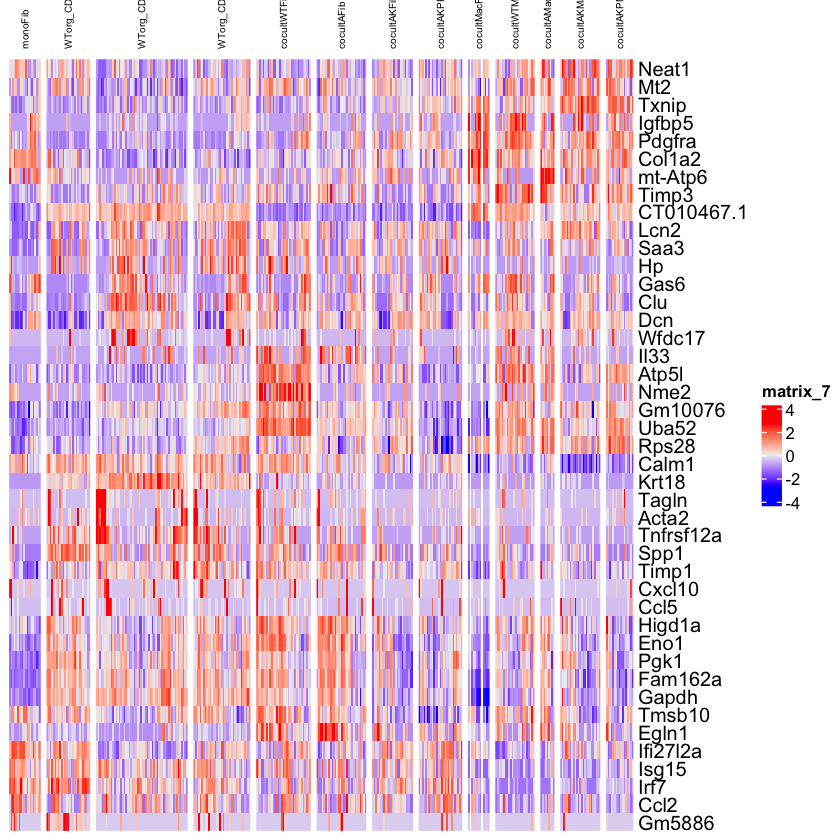

In [83]:
Heatmap(mat_DEorig,
        column_split = INTfib@meta.data$orig.ident,
        cluster_columns = TRUE, show_column_dend = FALSE, cluster_column_slices = FALSE,
        cluster_rows = TRUE, cluster_row_slices = TRUE, show_row_dend = FALSE,
        column_title_rot = 90, column_title_gp = gpar(fontsize=6),
        column_gap = unit(1.2, "mm"), show_column_names = FALSE
        )

## Figure

Fancy Heatmap with metadata annotations:


In [16]:
gDE_INTfib_orig_n6 <- gDE_INTfib_orig %>% group_by(cluster) %>% slice_max(n=6, order_by = c(abs(avg_log2FC)))
gList <- unique(gDE_INTfib_orig_n6$gene)
print(length(gList))
gList

[1] 43


[1] "CT010467.1" "Uba52"      "Nme2"       "Neat1"      "Gm10076"   
 [6] "Atp5l"      "Il33"       "Egln1"      "Igfbp5"     "Higd1a"    
[11] "Eno1"       "Spp1"       "Tagln"      "Krt18"      "Acta2"     
[16] "Tnfrsf12a"  "Wfdc17"     "Tmsb10"     "Rps28"      "Hp"        
[21] "Lcn2"       "Fam162a"    "Pgk1"       "Ccl2"       "Isg15"     
[26] "Irf7"       "Ifi27l2a"   "Timp3"      "Ccl5"       "Cxcl10"    
[31] "mt-Atp6"    "Txnip"      "Calm1"      "Timp1"      "Gapdh"     
[36] "Clu"        "Col1a2"     "Mt2"        "Pdgfra"     "Saa3"      
[41] "Dcn"        "Gm5886"     "Gas6"

In [29]:
gList <- c(
    "Neat1","Mt2","Txnip","Igfbp5", "Col1a2", "mt-Atp6", "Timp3", 
    "CT010467.1", "Lcn2", "Saa3", "Hp", "Gas6", "Clu", "Wfdc17", "Il33",
    "Atp5l", "Nme2", "Gm10076", "Uba52", "Rps28", "Calm1", "Krt18", "Tagln", 
    "Acta2", "Tnfrsf12a", "Spp1", "Timp1", "Cxcl10", "Ccl5", "Higd1a", "Eno1",
    "Pgk1", "Fam162a", "Gapdh", "Tmsb10", "Egln1", "Ifi27l2a", "Isg15", "Irf7", 
    "Ccl2", "Gm5886",

    "Cd34","Dcn","Pdgfra",
    "Thy1","Adamts1","Ifitm1"
)
print(length(gList))
print(length(unique(gList)))
gList


[1] 47
[1] 47


[1] "Neat1"      "Mt2"        "Txnip"      "Igfbp5"     "Col1a2"    
 [6] "mt-Atp6"    "Timp3"      "CT010467.1" "Lcn2"       "Saa3"      
[11] "Hp"         "Gas6"       "Clu"        "Wfdc17"     "Il33"      
[16] "Atp5l"      "Nme2"       "Gm10076"    "Uba52"      "Rps28"     
[21] "Calm1"      "Krt18"      "Tagln"      "Acta2"      "Tnfrsf12a" 
[26] "Spp1"       "Timp1"      "Cxcl10"     "Ccl5"       "Higd1a"    
[31] "Eno1"       "Pgk1"       "Fam162a"    "Gapdh"      "Tmsb10"    
[36] "Egln1"      "Ifi27l2a"   "Isg15"      "Irf7"       "Ccl2"      
[41] "Gm5886"     "Cd34"       "Dcn"        "Pdgfra"     "Thy1"      
[46] "Adamts1"    "Ifitm1"

In [30]:
mat_DEorig <- INTfib[["RNA"]]@scale.data[gList,] %>% 
                as.matrix()
mat_DEorig

,AAACCCACAGCTTCCT-1_1,AAACCCAGTTCGAGCC-1_1,AAACGAAAGAAGGATG-1_1,AAACGAACACCAGCTG-1_1,AAACGAACACCGTGCA-1_1,AAACGAACATACTTTC-1_1,AAACGCTCACAGCCAC-1_1,AAACGCTCATGACTAC-1_1,AAACGCTGTATCCCAA-1_1,AAACGCTGTCAAGGCA-1_1,⋯,TTTCGATCAGGTACGA-1_13,TTTCGATCATACAGAA-1_13,TTTCGATGTGTTCGAT-1_13,TTTCGATGTTCAAAGA-1_13,TTTCGATTCCCAACTC-1_13,TTTGACTAGGGTTGCA-1_13,TTTGACTCAGAGAAAG-1_13,TTTGATCGTGGATCAG-1_13,TTTGGAGAGAGAGAAC-1_13,TTTGGTTTCGAACGGA-1_13
Neat1,-0.52235756,-0.495376865,-1.098669692,-1.277657899,0.68905077,-0.17269383,0.51886974,-1.56452947,-0.787518617,0.86558082,⋯,0.488261881,-0.9606231815,1.08620280,-0.62078028,1.16336361,1.30519932,0.69631213,0.948016212,0.14795452,1.05539599
Mt2,-0.23017143,-1.047909043,1.269902154,-0.371466551,0.51764830,-1.15829116,1.76724385,-0.68337005,0.321456089,1.36100338,⋯,0.111297326,-0.8156678533,-0.75271782,0.23142390,-0.50896847,0.07687993,0.86196160,0.513025757,0.66971116,1.34951492
Txnip,-1.47204972,-0.858342238,0.234357044,-0.424315796,-0.84142968,0.25582274,-1.05936181,-0.63870687,0.683233369,-0.77879637,⋯,-1.472049716,-1.4720497164,-0.83810402,0.59810808,-0.01986153,-0.69380456,-1.23346984,0.004661606,-1.12093607,-0.51007684
Igfbp5,0.49174298,0.850291447,-0.775975489,0.161066071,0.27155777,1.40220811,-0.77597549,-0.77597549,0.536579561,-0.77597549,⋯,-0.775975489,-0.7759754890,-0.77597549,-0.02915267,-0.77597549,-0.77597549,-0.77597549,-0.775975489,-0.77597549,-0.77597549
Col1a2,0.44997725,0.493518416,-1.145760727,-0.912342916,0.43861985,-0.41589261,-0.17536442,-0.20228454,-0.004098263,0.74587049,⋯,-0.975836332,-0.3353879099,0.18048371,-0.08611334,-0.21249001,-1.15865439,-0.50306859,0.565906897,-1.08224147,-0.63980855
mt-Atp6,-0.84671043,-0.846710435,-0.846710435,-0.846710435,0.53063532,-0.84671043,0.05464679,-0.84671043,-0.846710435,-0.84671043,⋯,0.687025327,0.0947135730,0.79572079,-0.84671043,-0.30053530,1.24336229,0.11072541,0.031560019,0.51623337,1.59624132
Timp3,-1.22742215,-1.227422153,-0.587064599,-0.067324377,1.14156602,0.68575538,-0.15580343,-1.22742215,0.843454574,-1.22742215,⋯,-1.227422153,-1.2274221531,-1.22742215,-0.77127780,-1.22742215,-0.59723222,-0.38479618,0.046182453,-0.53647261,-1.22742215
CT010467.1,-0.18397181,-0.546836456,-1.329217207,-0.438563675,-0.81674603,-0.54946116,-1.27077346,-1.63888286,-0.530345344,-0.61707438,⋯,0.667946845,0.3360421941,0.47159812,0.20889183,1.37202506,0.41664291,0.99763431,0.544904030,0.40569379,0.60538668
Lcn2,-1.53539344,0.415312655,1.399462160,0.368792117,-0.02453677,0.86488941,-0.95330005,-0.22858915,1.108267042,-1.53539344,⋯,-1.113044603,0.9171041854,-1.42017634,1.25963194,-0.18641642,1.49098582,0.73077971,-1.196950010,0.25607110,0.30234645
Saa3,0.83410284,0.729887960,0.720705368,0.609631089,0.50550941,-0.45578130,-0.92480112,-0.15109746,0.546343664,-1.15315105,⋯,-0.166445001,-0.6211051262,-0.77343418,-0.08137731,0.42624174,0.70924669,1.41832439,-1.215262225,-0.20071706,0.03928344


In [21]:
palette_epigenotype <- c(
                    "WT"="#669966", 
                    "A"="#666633",
                    "AK"="#336699", 
                    "AKP"="#3366CC"
                    )
palette_macro <- c(
                    "0"="#FFFFFF",
                    "1"="#999999"
                    )
palette_seqrun <- c(
                    "First"="#ae00ff",
                    "Second"="#ff0000"
                    )
palette_cd34hi <- c(
                    "0"="#FFFFFF",
                    "1"="#ffd000"
                    )
palette_cd34lo <- c(
                    "0"="#FFFFFF",
                    "1"="#66ff00"
                    )

In [86]:
mdEPIgeno <- INTfib@meta.data %>%
                transmute(EPIgeno = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34lo", "WTorg_CD34hi", 
                        "WTorg_CD34hilo", "cocultWTFib","cocultWTMacFib"
                    ) ~ "WT",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAFib", "cocultAMacFib"
                    ) ~ "A",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAKFib", "cocultAKMacFib"
                    ) ~ "AK",
                    as.character.factor(orig.ident) %in% c(
                        "cocultAKPFib", "cocultAKPMacFib"
                    ) ~ "AKP",
                    #TRUE ~ as.character.factor(orig.ident)
                ))
mdEPIgeno %>% group_by(EPIgeno) %>% summarise(n())

EPIgeno,n()
<chr>,<int>
A,2805
AK,3565
AKP,3117
WT,12602
NA,2342


In [87]:
mdMAC <- INTfib@meta.data %>%
                transmute(MAC = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "cocultMacFib",
                        "cocultWTMacFib","cocultAMacFib",
                        "cocultAKMacFib", "cocultAKPMacFib"
                    ) ~ "1",
                    TRUE ~ "0"
                ))
mdMAC %>% group_by(MAC) %>% summarise(n())

MAC,n()
<chr>,<int>
0,18161
1,6270


In [88]:
mdSEQ <- INTfib@meta.data %>%
                transmute(SEQ = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34lo", "WTorg_CD34hi", "WTorg_CD34hilo"
                    ) ~ "Second",
                    TRUE ~ "First"
                ))
mdSEQ %>% group_by(SEQ) %>% summarise(n())

SEQ,n()
<chr>,<int>
First,15967
Second,8464


In [91]:
mdCD34 <- INTfib@meta.data %>%
                transmute(CD34hi = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34hi", "WTorg_CD34hilo"
                    ) ~ "1",
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34lo"
                    ) ~ "0",
                                            ),
                CD34lo = case_when(
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34lo", "WTorg_CD34hilo"
                    ) ~ "1",
                    as.character.factor(orig.ident) %in% c(
                        "WTorg_CD34hi"
                    ) ~ "0",
                ))
mdCD34 %>% group_by(CD34hi, CD34lo) %>% summarise(n())

`summarise()` has grouped output by 'CD34hi'. You can override using the
`.groups` argument.


CD34hi,CD34lo,n()
<chr>,<chr>,<int>
0,1,1923
1,0,4029
1,1,2512
NA,NA,15967


In [95]:
INTfib <- AddMetaData(INTfib, metadata = c(mdEPIgeno, mdMAC, mdSEQ, mdCD34))
head(INTfib@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,mito_content,rfp_content,gfp_content,nCount_SCT,nFeature_SCT,S.Score,G2M.Score,⋯,old.ident,CCDiff,SCT_snn_res.0.6,seurat_clusters,SCT_snn_res.0.1,EPIgeno,MAC,SEQ,CD34hi,CD34lo
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCCACAGCTTCCT-1_1,cocultWTFib,10761,3163,0.9478673,0.009292817,0,17183,3206,0.09172818,-0.035993356,⋯,cocultWTFib,0.12772154,4,4,NA,WT,0,First,NA,NA
AAACCCAGTTCGAGCC-1_1,cocultWTFib,15485,3811,1.2334517,0.000000000,0,17347,3811,0.04773247,-0.003213944,⋯,cocultWTFib,0.05094641,2,2,NA,WT,0,First,NA,NA
AAACGAAAGAAGGATG-1_1,cocultWTFib,16689,3775,1.2702978,0.000000000,0,17508,3775,0.04882882,-0.047011565,⋯,cocultWTFib,0.09584038,2,2,NA,WT,0,First,NA,NA
AAACGAACACCAGCTG-1_1,cocultWTFib,29829,5235,0.8917496,0.003352442,0,18905,5016,0.31804191,0.452043743,⋯,cocultWTFib,-0.13400183,7,7,NA,WT,0,First,NA,NA
AAACGAACACCGTGCA-1_1,cocultWTFib,14958,3741,1.0028079,0.000000000,0,17218,3741,0.03614619,-0.003748593,⋯,cocultWTFib,0.03989479,2,2,NA,WT,0,First,NA,NA
AAACGAACATACTTTC-1_1,cocultWTFib,29352,5383,1.2673753,0.003406923,0,19013,5171,0.08267449,0.010579537,⋯,cocultWTFib,0.07209495,2,2,NA,WT,0,First,NA,NA


In [22]:
htmp_anno <- HeatmapAnnotation(
                EPIgeno = INTfib@meta.data$EPIgeno,
                MAC = INTfib@meta.data$MAC,
                SEQ = INTfib@meta.data$SEQ,
                CD34hi = INTfib@meta.data$CD34hi,
                CD34lo = INTfib@meta.data$CD34lo,
                col=list(
                    EPIgeno = palette_epigenotype,
                    MAC = palette_macro,
                    SEQ = palette_seqrun,
                    CD34hi = palette_cd34hi,
                    CD34lo = palette_cd34lo
                ),
                na_col = "#FFFFFF"
)
htmp_anno

A HeatmapAnnotation object with 5 annotations
  name: heatmap_annotation_1 
  position: column 
  items: 24431 
  width: 1npc 
  height: 26.4058392140584mm 
  this object is subsettable
  17.2390666666667mm extension on the right 

    name annotation_type color_mapping height
 EPIgeno discrete vector  user-defined    5mm
     MAC discrete vector  user-defined    5mm
     SEQ discrete vector  user-defined    5mm
  CD34hi discrete vector  user-defined    5mm
  CD34lo discrete vector  user-defined    5mm

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



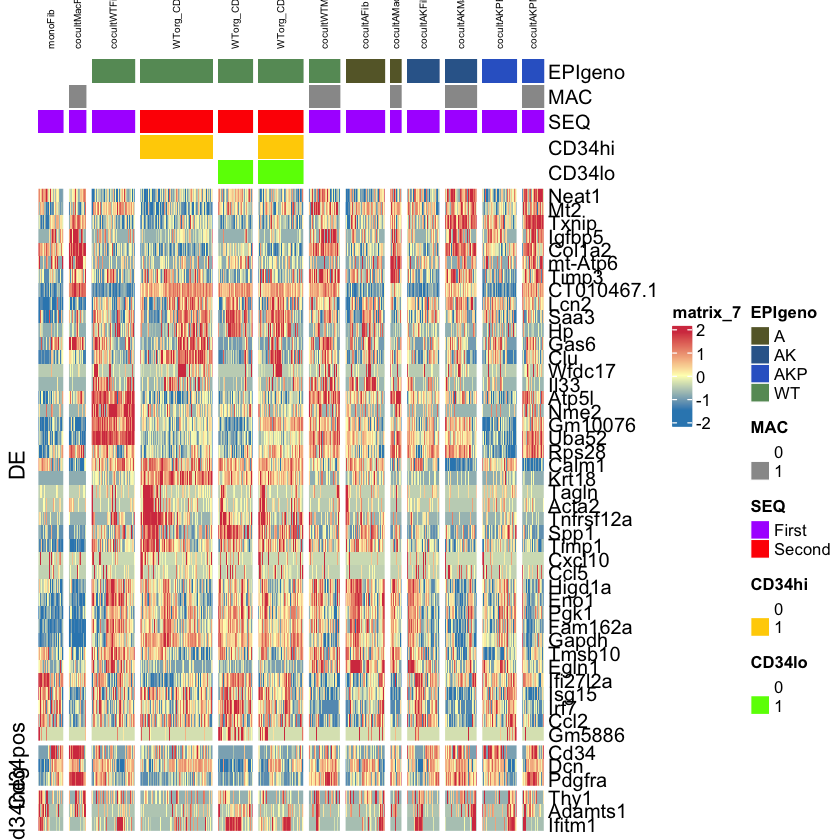

In [33]:
pHtmp_FIBconDE <- Heatmap(mat_DEorig,
        column_split = INTfib@meta.data$orig.ident,
        cluster_columns = TRUE, show_column_dend = FALSE, cluster_column_slices = FALSE,
        cluster_rows = FALSE, cluster_row_slices = FALSE, show_row_dend = FALSE,
        row_split = factor(
                        c(
                        rep("DE", 41),
                        rep("Cd34pos", 3),
                        rep("Cd34neg",3)
                        ),
                        levels = c(
                                "DE","Cd34pos","Cd34neg"
                                )
                        ),
        column_title_rot = 90, column_title_gp = gpar(fontsize=6),
        column_gap = unit(1.2, "mm"), show_column_names = FALSE,
        top_annotation = htmp_anno,
        use_raster = TRUE, raster_quality = 2,
        col=circlize::colorRamp2(
                c(round(quantile(mat_DEorig, c(0.04,0.96))[1], digits = 1),
                0, 
                round(quantile(mat_DEorig, c(0.04,0.96))[2], digits = 1)), 
                c("#3288BD", "#FEFEBD", "#D53E4F"))
        )

pHtmp_FIBconDE

# Save key objects

In [106]:
#INTfib
saveRDS(INTfib,"../RData/INTfib.rds")

In [2]:
INTfib <- readRDS("../RData/INTfib.rds")

In [107]:
#DEgenes
saveRDS(gDE_INTfib_orig,"../RData/gDE_INTfib_orig.rds")

In [10]:
gDE_INTfib_orig <- readRDS("../RData/gDE_INTfib_orig.rds")

In [34]:
#Heatmap
saveRDS(pHtmp_FIBconDE, "../RData/pHtmp_FIBconDE.rds")